In [1]:
library(tidyverse)
library(nnet)
library(purrr)
library(furrr)
library(lme4)
library(ggplot2)
library(patchwork)
library(ggbeeswarm)

options(ggrepel.max.overlaps = Inf)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   0.3.4
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.2.1     ✔ stringr 1.4.1
✔ readr   2.1.2     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Loading required package: future

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack




In [2]:
# xe_obj = qs::qread('230710_xenium_sct_unimapped_cca_polar_label.qs')
xe_obj_path = '_targets/objects/xe_obj_cca_td_2s_uni'
xe_obj = qs::qread(xe_obj_path)
xe_obj@meta.data = xe_obj@meta.data %>%
mutate(predicted.polar_label = polar_label) %>%
filter(!is.na(predicted.polar_label))
  

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




In [3]:
# mutate(polar_label = predicted.polar_label_2s) %>% #only for manual object
# mutate(predicted.polar_label = polar_label) %>% #only for manual object

In [4]:
xe_obj@assays$SCT@meta.features %>% rownames_to_column(var = 'genes') %>% filter(genes != 'Lmx1a') %>% pull(genes)

[1] "Sorcs1"   "Lingo2"   "Cntn4"    "Tenm2"    "Sox5"     "Ptprd"   
 [7] "Robo1"    "Plcl1"    "Oxr1"     "Plxdc2"   "Plp1"     "Kirrel3" 
[13] "Mgat4c"   "Tenm3"    "Slit2"    "Nrg3"     "Hdac9"    "Col25a1" 
[19] "Ncam2"    "Rbfox1"   "Fgf13"    "Pde10a"   "Deptor"   "Alcam"   
[25] "Gria1"    "Grid2"    "Fam155a"  "Grm7"     "Agrp"     "Naaladl2"
[31] "Ntm"      "Gpc5"     "Hs3st4"   "Lef1"     "Erbb4"    "Kctd16"  
[37] "Zfhx3"    "Gtdc1"    "Pdgfra"   "Nrg1"     "Macrod2"  "Gpc6"    
[43] "Pcdh11x"  "Kcnip4"   "Brinp3"   "Cadm2"    "Pde4b"    "Fhit"    
[49] "Rgs6"     "Prkg1"    "Dlg2"     "Ptprk"    "Luzp2"    "Ptprt"   
[55] "Nxph1"    "Kcnq3"    "Lrmda"    "Dcc"      "Cntn5"    "Adarb2"  
[61] "Gabrg3"   "Rmst"     "Lrp1b"    "Trpm3"    "P3h2"     "Prr16"   
[67] "Prkca"    "Nrxn3"    "Aqp4"     "Ctnna2"   "Inpp4b"   "Sgcz"    
[73] "Fat3"     "Plcb1"    "Cacna2d3" "Bmp4"     "Tox"      "Car10"   
[79] "Nkain2"   "Galntl6"  "Slc7a11"  "Pcdh9"    "Slc1a2"   "Pdzrn3"  
[85] "Rax"      "Pomc"     "Zfp804b"  "Wwox"     "Pcdh7"    "Grm8"    
[91] "Rtl4"     "Il1rapl2" "Sgcd"     "Egfem1"   "Arhgap6"  "Immp2l"  
[97] "Cfap299"  "Htr3b"    "Csmd1"

In [5]:
xe_obj@assays$SCT@meta.features %>% rownames

[1] "Sorcs1"   "Lingo2"   "Cntn4"    "Tenm2"    "Sox5"     "Ptprd"   
  [7] "Robo1"    "Plcl1"    "Oxr1"     "Plxdc2"   "Plp1"     "Kirrel3" 
 [13] "Mgat4c"   "Tenm3"    "Slit2"    "Nrg3"     "Hdac9"    "Col25a1" 
 [19] "Ncam2"    "Rbfox1"   "Fgf13"    "Pde10a"   "Deptor"   "Alcam"   
 [25] "Gria1"    "Grid2"    "Fam155a"  "Grm7"     "Agrp"     "Naaladl2"
 [31] "Ntm"      "Gpc5"     "Hs3st4"   "Lef1"     "Erbb4"    "Kctd16"  
 [37] "Zfhx3"    "Gtdc1"    "Pdgfra"   "Nrg1"     "Macrod2"  "Gpc6"    
 [43] "Pcdh11x"  "Kcnip4"   "Brinp3"   "Cadm2"    "Pde4b"    "Fhit"    
 [49] "Rgs6"     "Prkg1"    "Dlg2"     "Ptprk"    "Luzp2"    "Ptprt"   
 [55] "Nxph1"    "Kcnq3"    "Lrmda"    "Dcc"      "Cntn5"    "Adarb2"  
 [61] "Gabrg3"   "Rmst"     "Lrp1b"    "Trpm3"    "P3h2"     "Prr16"   
 [67] "Prkca"    "Nrxn3"    "Aqp4"     "Ctnna2"   "Inpp4b"   "Sgcz"    
 [73] "Fat3"     "Plcb1"    "Cacna2d3" "Bmp4"     "Tox"      "Car10"   
 [79] "Nkain2"   "Galntl6"  "Slc7a11"  "Pcdh9"    "Slc1a2"   "Pdzrn3"  
 [85] "Rax"      "Pomc"     "Zfp804b"  "Wwox"     "Pcdh7"    "Grm8"    
 [91] "Rtl4"     "Il1rapl2" "Sgcd"     "Egfem1"   "Arhgap6"  "Immp2l"  
 [97] "Cfap299"  "Htr3b"    "Csmd1"    "Lmx1a"

In [6]:
xe_obj %>% `[[` %>% pull(predicted.polar_label) %>% unique

[1] "Trh_Cxcl12.none"                 "Slc17a6_Trhr.none"              
 [3] "Sst_Unc13c__Agrp.none"           "Unassigned2.none"               
 [5] "Tbx19.none"                      "Pomc_Lepr.none"                 
 [7] "Rgs16_Nmu.none"                  "Kisspeptin.none"                
 [9] "Gm8773_Tac1__Hdc.none"           "Rgs16_Dlx1__Unassigned2.none"   
[11] "Unassigned1.sc17.sc28.none"      "Nr5a1_Bdnf.none"                
[13] "Htr3b.none"                      "Tmem215.none"                   
[15] "Slc17a6_Fam19a2.none"            "Unassigned1.sc39.none"          
[17] "Unassigned1.sc37.none"           "Nr5a1_Nfib.none"                
[19] "Sst_Pthlh.sc21.none"             "Ghrh.none"                      
[21] "Th_Nfib__Arx_Nr5a2.none"         "Trh_Lef1.none"                  
[23] "Nr5a1_Bdnf__Unassigned1.none"    "Oxt__Unassigned1.none"          
[25] "Pomc_Glipr1__Slc17a6_Trhr.none"  "Trh_Lef1.neg"                   
[27] "Qrfp.none"                       "Agrp.none"                      
[29] "Nr5a1_Bdnf__Nr5a1_Nfib.none"     "Sst_Pthlh.sc23.none"            
[31] "Trh_Lef1.pos"                    "Rgs16_Dlx1.none"                
[33] "Sst_Nts.none"                    "Nfix_Htr2c.none"                
[35] "Htr3b.neg"                       "Gpr50.none"                     
[37] "Th_Slc6a3.none"                  "Sst_Pthlh__Ghrh.none"           
[39] "Unassigned2__Unassigned1.none"   "Sst_Pthlh.sc23.pos"             
[41] "Agrp.neg"                        "Agrp.pos"                       
[43] "Htr3b.pos"                       "Sst_Unc13c__Agrp.neg"           
[45] "Unassigned1.sc17.sc28.pos"       "Sst_Unc13c__Agrp.pos"           
[47] "a1_Tany__Astrocytes.none"        "a2_Tanycytes.none"              
[49] "MOL.none"                        "b1_Tanycytes.none"              
[51] "Astrocytes.none"                 "a2_Tanycytes__b1_Tanycytes.none"
[53] "Astrocytes.neg"                  "NG2_OPC2.none"                  
[55] "NFOL.pos"                        "Epend.none"                     
[57] "b1_Tanycytes.neg"                "Endothelial.none"               
[59] "b2_Tany.none"                    "NG2_OPC2__Microglia.none"       
[61] "MOL.pos"                         "Microglia.none"                 
[63] "NG2_OPC2.neg"                    "a1_Tany__Astrocytes.pos"        
[65] "a1_Tany__Astrocytes.neg"         "Fibroblasts2__Fibroblasts3.none"
[67] "Parstuber2A__ParsTuber1.none"    "NG2_OPC2.pos"                   
[69] "Mural_Cells2.none"               "a2_Tanycytes.pos"               
[71] "Astrocytes.pos"                  "MOL.neg"                        
[73] "b1_Tanycytes.pos"                "MOL__a2_Tanycytes.none"

In [7]:
xe_obj %>%
`[[` %>%
rownames %>% length

[1] 60337

In [8]:
xe_obj@meta.data %>% colnames

[1] "orig.ident"                       "nCount_Xenium"                   
 [3] "nFeature_Xenium"                  "nCount_BlankCodeword"            
 [5] "nFeature_BlankCodeword"           "nCount_ControlCodeword"          
 [7] "nFeature_ControlCodeword"         "nCount_ControlProbe"             
 [9] "nFeature_ControlProbe"            "cell_area"                       
[11] "density"                          "elongation"                      
[13] "avg_confidence"                   "nucleus_area"                    
[15] "sample_name"                      "treatment"                       
[17] "strain"                           "time"                            
[19] "nCount_SCT"                       "nFeature_SCT"                    
[21] "predicted.id.score"               "predicted.id"                    
[23] "cell_class"                       "cell_class_prediction.score.max" 
[25] "polar_label"                      "polar_label_prediction.score.max"
[27] "labels"                           "labels_prediction.score.max"     
[29] "predicted.polar_label"

In [9]:
meta = xe_obj@meta.data

In [10]:
summary_df = xe_obj %>% 
`[[` %>%
group_by(treatment, predicted.polar_label) %>%
summarise(n = n()) %>%
pivot_wider(names_from = treatment, values_from = n) %>%
mutate(predicted.label = predicted.polar_label %>% str_replace(fixed('.neg'), '') %>% str_replace(fixed('.none'), '') %>% str_replace(fixed('.pos'), '')) %>%
rowwise %>%
mutate(polarity = str_split(predicted.polar_label, fixed('.')) %>% unlist %>% `[[`(2)) %>%
ungroup %>%
group_by(predicted.label) %>%
mutate(FGF1_label_count = sum(FGF1)) %>%
mutate(VehPF_label_count = sum(Veh_PF)) %>%
mutate(label_diff = FGF1_label_count-VehPF_label_count) %>%
mutate(label_diff_frac = label_diff/VehPF_label_count) %>%
mutate(FGF1_minus_VehPF_polar = FGF1 - Veh_PF) %>%
relocate(FGF1_minus_VehPF_polar, .after='Veh_PF') %>%
ungroup %>%
mutate(sum_FGF1_all = sum(FGF1, na.rm = TRUE)) %>%
mutate(sum_VehPF_all = sum(Veh_PF, na.rm=TRUE)) %>%
mutate(FGF1_minus_VehPF_all = sum_FGF1_all - sum_VehPF_all) %>%
arrange(desc(abs(label_diff)))


summary_df

`summarise()` has grouped output by 'treatment'. You can override using the
`.groups` argument.


predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Unassigned2.none,3485,3984,-499,Unassigned2,none,3485,3984,-499,-0.12525100,29425,30912,-1487
Nr5a1_Bdnf.none,5319,5558,-239,Nr5a1_Bdnf,none,5319,5558,-239,-0.04300108,29425,30912,-1487
Rgs16_Nmu.none,727,934,-207,Rgs16_Nmu,none,727,934,-207,-0.22162741,29425,30912,-1487
Pomc_Lepr.none,797,938,-141,Pomc_Lepr,none,797,938,-141,-0.15031983,29425,30912,-1487
NFOL.pos,250,134,116,NFOL,pos,250,134,116,0.86567164,29425,30912,-1487
Rgs16_Dlx1.none,193,303,-110,Rgs16_Dlx1,none,193,303,-110,-0.36303630,29425,30912,-1487
Nr5a1_Bdnf__Unassigned1.none,430,531,-101,Nr5a1_Bdnf__Unassigned1,none,430,531,-101,-0.19020716,29425,30912,-1487
a2_Tanycytes__b1_Tanycytes.none,348,436,-88,a2_Tanycytes__b1_Tanycytes,none,348,436,-88,-0.20183486,29425,30912,-1487
Trh_Lef1.neg,13,29,-16,Trh_Lef1,neg,299,376,-77,-0.20478723,29425,30912,-1487


In [11]:
summary_df %>% filter(str_detect(predicted.polar_label,'Trh_Lef1'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Trh_Lef1.neg,13,29,-16,Trh_Lef1,neg,299,376,-77,-0.2047872,29425,30912,-1487
Trh_Lef1.none,224,249,-25,Trh_Lef1,none,299,376,-77,-0.2047872,29425,30912,-1487
Trh_Lef1.pos,62,98,-36,Trh_Lef1,pos,299,376,-77,-0.2047872,29425,30912,-1487


In [12]:
summary_df %>% filter(str_detect(predicted.polar_label,'MOL'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
MOL.neg,6,7,-1,MOL,neg,1249,1303,-54,-0.04144282,29425,30912,-1487
MOL.none,760,866,-106,MOL,none,1249,1303,-54,-0.04144282,29425,30912,-1487
MOL.pos,483,430,53,MOL,pos,1249,1303,-54,-0.04144282,29425,30912,-1487
MOL__a2_Tanycytes.none,1,1,0,MOL__a2_Tanycytes,none,1,1,0,0.00000000,29425,30912,-1487


In [13]:
summary_df %>% filter(str_detect(predicted.polar_label,'NG2_OPC2'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
NG2_OPC2__Microglia.none,298,265,33,NG2_OPC2__Microglia,none,298,265,33,0.12452830,29425,30912,-1487
NG2_OPC2.neg,147,183,-36,NG2_OPC2,neg,777,806,-29,-0.03598015,29425,30912,-1487
NG2_OPC2.none,533,542,-9,NG2_OPC2,none,777,806,-29,-0.03598015,29425,30912,-1487
NG2_OPC2.pos,97,81,16,NG2_OPC2,pos,777,806,-29,-0.03598015,29425,30912,-1487


In [14]:
summary_df %>% filter(str_detect(predicted.polar_label,'Agrp'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Agrp.neg,75,138,-63,Agrp,neg,817,822,-5,-0.006082725,29425,30912,-1487
Agrp.none,734,677,57,Agrp,none,817,822,-5,-0.006082725,29425,30912,-1487
Agrp.pos,8,7,1,Agrp,pos,817,822,-5,-0.006082725,29425,30912,-1487
Sst_Unc13c__Agrp.neg,4,2,2,Sst_Unc13c__Agrp,neg,274,NA,NA,NA,29425,30912,-1487
Sst_Unc13c__Agrp.none,267,264,3,Sst_Unc13c__Agrp,none,274,NA,NA,NA,29425,30912,-1487
Sst_Unc13c__Agrp.pos,3,NA,NA,Sst_Unc13c__Agrp,pos,274,NA,NA,NA,29425,30912,-1487


In [15]:
comparison_df = xe_obj %>% 
`[[` %>%
rownames_to_column(var = 'cell') %>%
dplyr::select(cell, sample_name, treatment, predicted.polar_label) %>%
rowwise %>%
mutate(label = predicted.polar_label %>% str_replace("\\.(pos|neg|none)$", ''),
       polarity = predicted.polar_label %>% str_split(fixed('.')) %>% unlist %>% last) %>%
mutate(treatment = factor(treatment, levels=c('Veh_PF', 'FGF1'))) %>%
mutate(polarity = factor(polarity, levels = c('none', 'neg', 'pos'))) %>% 
group_by(sample_name) %>%
mutate(sample_cell_count = n()) %>%
group_by(sample_name, label) %>%
mutate(sample_label_cell_count = n()) %>%
ungroup

comparison_df %>% print

# A tibble: 60,337 × 8
   cell               sample_name treatment predicted.polar_label label polarity
   <chr>              <chr>       <fct>     <chr>                 <chr> <fct>   
 1 Cell10000_9129_13… A1          Veh_PF    Trh_Cxcl12.none       Trh_… none    
 2 Cell10001_7423_16… A1          Veh_PF    Slc17a6_Trhr.none     Slc1… none    
 3 Cell10002_2432_23… A1          Veh_PF    Sst_Unc13c__Agrp.none Sst_… none    
 4 Cell10004_9190_60… A1          Veh_PF    Unassigned2.none      Unas… none    
 5 Cell10006_3751_14… A1          Veh_PF    Tbx19.none            Tbx19 none    
 6 Cell10008_4292_32… A1          Veh_PF    Pomc_Lepr.none        Pomc… none    
 7 Cell1000_5663_268… A1          Veh_PF    Tbx19.none            Tbx19 none    
 8 Cell10016_8010_96… A1          Veh_PF    Unassigned2.none      Unas… none    
 9 Cell10019_6171_75… A1          Veh_PF    Trh_Cxcl12.none       Trh_… none    
10 Cell10020_7108_16… A1          Veh_PF    Rgs16_Nmu.none        Rgs1… none    
# ℹ 6

In [16]:
comparison_df %>% group_by(label) %>% summarise(polarities = list(polarity %>% droplevels %>% levels))

label,polarities
<chr>,<list>
Agrp,"none, neg , pos"
Astrocytes,"none, neg , pos"
Endothelial,none
Epend,none
Fibroblasts2__Fibroblasts3,none
Ghrh,none
Gm8773_Tac1__Hdc,none
Gpr50,none
Htr3b,"none, neg , pos"


In [17]:
df = comparison_df %>% filter(label == 'MOL') %>%
mutate(polarity = polarity %>% relevel(ref = 'none')) %>%
mutate(polarity =  polarity %>% droplevels)
df %>% print

# A tibble: 2,552 × 8
   cell               sample_name treatment predicted.polar_label label polarity
   <chr>              <chr>       <fct>     <chr>                 <chr> <fct>   
 1 Cell1001_7582_755… A1          Veh_PF    MOL.none              MOL   none    
 2 Cell10049_9585_16… A1          Veh_PF    MOL.none              MOL   none    
 3 Cell10189_7738_41… A1          Veh_PF    MOL.none              MOL   none    
 4 Cell10207_4078_55… A1          Veh_PF    MOL.none              MOL   none    
 5 Cell1025_4270_414… A1          Veh_PF    MOL.pos               MOL   pos     
 6 Cell10564_3209_42… A1          Veh_PF    MOL.none              MOL   none    
 7 Cell10654_7388_59… A1          Veh_PF    MOL.none              MOL   none    
 8 Cell10704_10469_1… A1          Veh_PF    MOL.none              MOL   none    
 9 Cell1078_7267_128… A1          Veh_PF    MOL.none              MOL   none    
10 Cell10957_4996_10… A1          Veh_PF    MOL.none              MOL   none    
# ℹ 2,

In [18]:
make_input_df = function(comparison_df_chunk){
    input_df = comparison_df_chunk %>%
        mutate(polarity = polarity %>% relevel(ref = 'none')) %>%
        mutate(polarity =  polarity %>% droplevels)
    input_df
}

In [106]:
fit_multinom = function(input_df){
    # Fit the multinomial logistic regression model
#     model <- multinom(polarity ~ treatment + sample_name, data = input_df)
    model <- multinom(polarity ~ treatment, data = input_df)
    model
}

In [107]:
get_multinom_coef = function(model){
    coefs = summary(model)$coefficients
    coefs
}

get_multinom_zvalues = function(model){
    zvalues = summary(model)$coefficients / summary(model)$standard.errors
    zvalues
}

get_multinom_pvalues = function(zvalues){
    pvalues = 2 * (1 - pnorm(abs(zvalues)))
    pvalues
}



In [108]:
.get_results_long_to_wide_df = function(results, polarity_name, value.type){
    results_df = results %>% as.data.frame %>%
    set_names(polarity_name) %>%
#     set_names(input_df %>% pull(polarity) %>% levels %>% last) %>% 
    t %>% as.data.frame %>%
    mutate(value_type = value.type) %>%
    rownames_to_column %>%
    relocate(value_type, .after='polarity')
    results_df
}

In [109]:
.get_results_already_wide_df = function(results, value.type){
    results_df = results %>% 
    as.data.frame %>%
    rownames_to_column(var = 'polarity') %>%
    mutate(value_type = value.type) %>%
    relocate(value_type, .after='polarity')
    results_df
}

In [110]:
make_multinom_results_df = function(df){
    input_df = make_input_df(df)
    model = fit_multinom(input_df)
    zvalues = model %>% get_multinom_zvalues
    pvalues = zvalues %>% get_multinom_pvalues
    coefs = model %>% get_multinom_coef
    polarity_levels = input_df %>% pull(polarity) %>% levels
    if (length(polarity_levels) > 2){
        zvalues_df = .get_results_already_wide_df(zvalues, 'zvalue')
        pvalues_df = .get_results_already_wide_df(pvalues, 'pvalue')
        coefs_df = .get_results_already_wide_df(coefs, 'coef')
    } else {
        polarity_name = polarity_levels %>% last
        zvalues_df = .get_results_long_to_wide_df(zvalues, polarity_name, 'zvalue')
        pvalues_df = .get_results_long_to_wide_df(pvalues, polarity_name, 'pvalue')
        coefs_df = .get_results_long_to_wide_df(coefs, polarity_name, 'pvalue')
    }
    results_df = rbind(pvalues_df, zvalues_df, coefs_df) %>%
    mutate(label = input_df %>% distinct(label) %>% pull) %>%
    relocate(label)
    results_df
}

In [111]:
make_multinom_results_df_safe = function(df){
    results_df = tryCatch(
        make_multinom_results_df(df),
        error = function(e) data.frame()
    )
    results_df
}

In [112]:
#no idea why I removed this
# comparison_df_f = comparison_df %>%
# filter(!(sample_name == 'D2' & label == 'Agrp'))

# entire comparison_df
comparison_df_f = comparison_df 

In [113]:
#no idea why I removed this
# comparison_df_f = comparison_df %>%
# filter(!(sample_name == 'C2' & label == 'Rgs16_Dlx1'))
comparison_df_f = comparison_df 
# entire comparison_df


In [114]:
# Group the dataframe by label and fit glmer model in parallel
results_df_list <- comparison_df_f %>%
  group_split(label) %>%
  map(function(subset) {
      result_list = subset %>% make_multinom_results_df_safe
      result_list
  })

results_df = results_df_list %>% bind_rows


# weights:  9 (4 variable)
initial  value 1800.625541 
iter  10 value 706.905711
final  value 705.759146 
converged
# weights:  9 (4 variable)
initial  value 3995.652894 
iter  10 value 2255.012968
iter  10 value 2255.012951
final  value 2255.012951 
converged
# weights:  9 (4 variable)
initial  value 1007.427469 
iter  10 value 447.565449
iter  10 value 447.565449
final  value 447.565449 
converged
# weights:  9 (4 variable)
initial  value 2803.658561 
iter  10 value 1741.949626
final  value 1735.568312 
converged
# weights:  9 (4 variable)
initial  value 1739.103253 
iter  10 value 1320.464726
final  value 1319.983654 
converged
# weights:  3 (2 variable)
initial  value 385.389832 
final  value 138.350274 
converged
# weights:  9 (4 variable)
initial  value 593.250636 
iter  10 value 92.616015
final  value 49.133856 
converged
# weights:  9 (4 variable)
initial  value 741.563295 
iter  10 value 511.698651
final  value 511.698597 
converged
# weights:  3 (2 variable)
initial  value 54

In [115]:
results_df %>% head # all Agrp

,label,polarity,value_type,(Intercept),treatmentFGF1
,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,Agrp,neg,pvalue,0.000000,6.398940e-06
2,Agrp,pos,pvalue,0.000000,9.193125e-01
3,Agrp,neg,zvalue,-17.028108,-4.512760e+00
4,Agrp,pos,zvalue,-12.033591,1.012997e-01
5,Agrp,neg,coef,-1.590418,-6.906029e-01
6,Agrp,pos,coef,-4.571792,5.270538e-02


In [116]:
results_df %>% head #no A1 Agrp

,label,polarity,value_type,(Intercept),treatmentFGF1
,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,Agrp,neg,pvalue,0.000000,6.398940e-06
2,Agrp,pos,pvalue,0.000000,9.193125e-01
3,Agrp,neg,zvalue,-17.028108,-4.512760e+00
4,Agrp,pos,zvalue,-12.033591,1.012997e-01
5,Agrp,neg,coef,-1.590418,-6.906029e-01
6,Agrp,pos,coef,-4.571792,5.270538e-02


In [117]:
results_df %>% head #no D2 Agrp

,label,polarity,value_type,(Intercept),treatmentFGF1
,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,Agrp,neg,pvalue,0.000000,6.398940e-06
2,Agrp,pos,pvalue,0.000000,9.193125e-01
3,Agrp,neg,zvalue,-17.028108,-4.512760e+00
4,Agrp,pos,zvalue,-12.033591,1.012997e-01
5,Agrp,neg,coef,-1.590418,-6.906029e-01
6,Agrp,pos,coef,-4.571792,5.270538e-02


In [118]:
polarity_sig_df = results_df %>% 
select(label, polarity, treatmentFGF1, value_type) %>% distinct %>%
# group_by(label, polarity) %>%
pivot_wider(names_from = 'value_type', values_from = 'treatmentFGF1') %>%
rename(pval = pvalue, z = zvalue) %>%
ungroup %>%
mutate(pval_corrected = p.adjust(pval, method = "BH")) %>%
arrange(label) %>% 
mutate(significant = case_when(pval < 0.05 ~ '**',
                                TRUE ~ '')) %>%
mutate(significant_adj = case_when(pval_corrected < 0.05 ~ '**',
                               TRUE ~ '')) %>%
relocate(pval, coef, z, significant, significant_adj, .after='polarity') %>%
mutate(z = case_when(abs(z) > 8 ~ sign(z)*8,
                     TRUE ~ z))

polarity_sig_df

label,polarity,pval,coef,z,significant,significant_adj,pval_corrected
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
Agrp,neg,6.398940e-06,-0.69060293,-4.51276006,**,**,3.839364e-05
Agrp,pos,9.193125e-01,0.05270538,0.10129971,,,9.665523e-01
Astrocytes,neg,4.023530e-01,0.07582471,0.83742624,,,5.818167e-01
Astrocytes,pos,1.413653e-05,0.72691205,4.34172975,**,**,6.361441e-05
Htr3b,neg,4.474579e-01,0.18839030,0.75965987,,,5.818167e-01
Htr3b,pos,6.189350e-01,0.14115949,0.49736031,,,6.963019e-01
MOL,neg,9.665523e-01,-0.02342165,-0.04193281,,,9.665523e-01
MOL,pos,2.898522e-03,0.24679492,2.97829997,**,**,8.695565e-03
NG2_OPC2,neg,1.096033e-01,-0.20230965,-1.59997856,,,2.192067e-01


In [119]:
get_glmer_pvalue = function(model){
    model_summary = summary(model)
    pvalue = model_summary %>% 
        `[[`('coefficients') %>%
        as.data.frame %>%
        dplyr::select(any_of('Pr(>|z|)')) %>%
        rownames_to_column %>%
        filter(rowname == 'treatmentFGF1') %>%
        pull('Pr(>|z|)')
    pvalue
}

get_glmer_coef = function(model){
    model_summary = summary(model)
    coef = model_summary %>% 
        `[[`('coefficients') %>%
        as.data.frame %>%
        dplyr::select(any_of('Estimate')) %>%
        rownames_to_column %>%
        filter(rowname == 'treatmentFGF1') %>%
        pull('Estimate')
    coef
}

In [120]:
make_result = function(subset){
    result_name = subset %>% distinct(label) %>% pull
    model = tryCatch(
      glmer(polarity ~ treatment + (1 | sample_name), data = subset, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    result_list = list(name = result_name,
                       pval = pval,
                       coef = coef,
                       model = model)
    result_list
}

In [121]:


# Group the dataframe by label and fit glmer model in parallel
models <- comparison_df %>%
  group_split(label) %>%
  map(function(subset) {
      result_list = subset %>% make_result
      result_list
  })


In [122]:


# Combine models into a tibble
result <- map_dfr(models, ~ tibble(label = .x$name, pval = .x$pval, coef = .x$coef))

# Print the result
result %>% arrange(pval)


label,pval,coef
<chr>,<dbl>,<lgl>
Agrp,1,NA
Astrocytes,1,NA
Endothelial,1,NA
Epend,1,NA
Fibroblasts2__Fibroblasts3,1,NA
Ghrh,1,NA
Gm8773_Tac1__Hdc,1,NA
Gpr50,1,NA
Htr3b,1,NA


In [123]:
make_glmer_result_ncells = function(comparison_df, current_ct){
    comparison_df_1vr = comparison_df %>%
        mutate(test_label = case_when(label == current_ct ~ current_ct,
                                      TRUE ~ 'other')) %>%
        mutate(test_label = factor(test_label, levels=c('other', current_ct)))
    print(dim(comparison_df_1vr))
    model = tryCatch(
      glmer(test_label ~ treatment + (1 | sample_name), data = comparison_df_1vr, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    result_list = list(name = current_ct,
                       pval = pval,
                       coef = coef,
                       model = model)
    result_list
}

In [124]:
make_glmer_result_ncells = function(comparison_df, current_ct){
    comparison_df_1vr = comparison_df %>%
        mutate(test_label = case_when(label == current_ct ~ current_ct,
                                      TRUE ~ 'other')) %>%
        mutate(test_label = factor(test_label, levels=c('other', current_ct)))
    print(dim(comparison_df_1vr))
    model = tryCatch(
      glmer(test_label ~ treatment + (1 | sample_name), data = comparison_df_1vr, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    zscores = tryCatch(
           summary(model)$coefficients[,"z value"][[2]],
           error = function(e) NA
       )
    result_list = list(name = current_ct,
                       pval = pval,
                       coef = coef,
                       zscores = zscores,
                       model = model)
    result_list
}


In [125]:
comparison_df %>% head

cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count
<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>
Cell10000_9129_13312_1,A1,Veh_PF,Trh_Cxcl12.none,Trh_Cxcl12,none,10744,273
Cell10001_7423_16733_1,A1,Veh_PF,Slc17a6_Trhr.none,Slc17a6_Trhr,none,10744,108
Cell10002_2432_2392_1,A1,Veh_PF,Sst_Unc13c__Agrp.none,Sst_Unc13c__Agrp,none,10744,64
Cell10004_9190_600_1,A1,Veh_PF,Unassigned2.none,Unassigned2,none,10744,1327
Cell10006_3751_1404_1,A1,Veh_PF,Tbx19.none,Tbx19,none,10744,75
Cell10008_4292_3239_1,A1,Veh_PF,Pomc_Lepr.none,Pomc_Lepr,none,10744,351


In [126]:
labels <- unique(comparison_df$label)

# Group the dataframe by label and fit glmer model in parallel
models = map(labels, function(current_ct) {
  results_list = make_glmer_result_ncells(comparison_df, current_ct)
  results_list
})

[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9
[1] 60337     9


In [127]:
sumstats_comparison = comparison_df %>% 
group_by(sample_name, treatment, label) %>% 
summarise(n=n()) %>% 
group_by(label, treatment) %>% 
summarise(median = median(n), mean=mean(n), min=min(n), max=max(n)) 

# sumstats_comparison %>% head

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'label'. You can override using the
`.groups` argument.


In [128]:
sumstats_comparison %>% group_by(label) %>% summarise(max_group_median = max(median))

label,max_group_median
<chr>,<dbl>
Agrp,223.5
Astrocytes,484.5
Endothelial,22.0
Epend,61.5
Fibroblasts2__Fibroblasts3,50.0
Ghrh,116.0
Gm8773_Tac1__Hdc,52.0
Gpr50,47.5
Htr3b,119.5


In [42]:
sumstats_comparison %>% filter(label == 'NFOL')

label,treatment,median,mean,min,max
<chr>,<fct>,<dbl>,<dbl>,<int>,<int>
NFOL,Veh_PF,32,33.5,24,46
NFOL,FGF1,66,62.5,36,82


In [43]:
sumstats_comparison %>% filter(label == 'Trh_Lef1')

label,treatment,median,mean,min,max
<chr>,<fct>,<dbl>,<dbl>,<int>,<int>
Trh_Lef1,Veh_PF,92.5,94.00,68,123
Trh_Lef1,FGF1,83.5,74.75,37,95


In [44]:
# Combine models into a tibble
ncells_result <- map_dfr(models, ~ tibble(label = .x$name, pval = .x$pval, coef = .x$coef, zscore = .x$zscores))


# Print the result
ncells_sig_df = ncells_result %>% 
arrange(pval) %>% 
mutate(pval_corrected = p.adjust(pval, method = "BH")) %>%
mutate(significant = case_when(pval < 0.05 ~ '**',
                               TRUE ~ '')) %>%
mutate(significant_adj = case_when(pval_corrected < 0.05 ~ '**',
                               TRUE ~ ''))

ncells_sig_df %>% head(15)

label,pval,coef,zscore,pval_corrected,significant,significant_adj
<chr>,<dbl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>
Trh_Cxcl12,1,NA,NA,1,,
Slc17a6_Trhr,1,NA,NA,1,,
Sst_Unc13c__Agrp,1,NA,NA,1,,
Unassigned2,1,NA,NA,1,,
Tbx19,1,NA,NA,1,,
Pomc_Lepr,1,NA,NA,1,,
Rgs16_Nmu,1,NA,NA,1,,
Kisspeptin,1,NA,NA,1,,
Gm8773_Tac1__Hdc,1,NA,NA,1,,


In [45]:
agg_data = comparison_df %>%
group_by(sample_name, treatment, label) %>%
summarise(cell_count = n())

agg_data %>% print

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.


# A tibble: 418 × 4
# Groups:   sample_name, treatment [8]
   sample_name treatment label                      cell_count
   <chr>       <fct>     <chr>                           <int>
 1 A1          Veh_PF    Agrp                              294
 2 A1          Veh_PF    Astrocytes                        645
 3 A1          Veh_PF    Endothelial                        32
 4 A1          Veh_PF    Epend                             113
 5 A1          Veh_PF    Fibroblasts2__Fibroblasts3         47
 6 A1          Veh_PF    Ghrh                              163
 7 A1          Veh_PF    Gm8773_Tac1__Hdc                   93
 8 A1          Veh_PF    Gpr50                              58
 9 A1          Veh_PF    Htr3b                             147
10 A1          Veh_PF    Kisspeptin                        186
# ℹ 408 more rows


In [46]:
wilcox_test_result <- wilcox.test(cell_count ~ treatment, data = agg_data)
wilcox_test_result


	Wilcoxon rank sum test with continuity correction

data:  cell_count by treatment
W = 22178, p-value = 0.7853
alternative hypothesis: true location shift is not equal to 0


In [47]:
wilcox_test_result$p.value

[1] 0.7852525

In [48]:
wilcox_test_result$statistic

W 
22177.5

In [49]:
make_result_wilcox = function(subset){
    result_name = subset %>% distinct(label) %>% pull
    pval = tryCatch(
      wilcox.test(cell_count ~ treatment, data = subset)$p.value, 
      error = function(e) NA
    )
    result_list = list(name = result_name,
                       pval = pval)
    result_list
}

In [50]:
# Set up parallel processing
# plan(multisession, workers=40)  # Adjust according to your system capabilities

# Group the dataframe by label and fit glmer model in parallel
models_wilcox <- agg_data %>% group_by(label) %>% group_split %>%
  map(function(subset) {
      result_list = subset %>% make_result_wilcox
      result_list
  })


Warning message in wilcox.test.default(x = c(58L, 44L, 30L, 44L), y = c(54L, 25L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(186L, 109L, 91L, 101L), y = c(128L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = 1L, y = 1L):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(19L, 11L, 7L, 16L), y = c(17L, 8L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(46L, 28L, 36L, 24L), y = c(36L, 82L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(17L, 56L, 15L, 1L), y = c(1L, 1L, 10L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(27L, 3L, 6L, 27L), y = c(11L, 31L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(53L, 59L, 52L, 56L), y = c(44L, 48L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.

In [51]:
wilcox_tibble = tibble(
  name = map_chr(models_wilcox, "name"),
  pval = map_dbl(models_wilcox, "pval")
) %>%
arrange(pval)

wilcox_tibble

name,pval
<chr>,<dbl>
NFOL,0.0814291
Sst_Pthlh__Ghrh,0.1080634
Oxt__Unassigned1,0.1831502
Rgs16_Dlx1,0.2000000
Parstuber2A__ParsTuber1,0.3094241
Endothelial,0.3428571
Mural_Cells2,0.3836303
Unassigned1.sc37,0.3836303
Ghrh,0.4857143


In [52]:
xe_obj@images %>% names

[1] "fov"     "fov.1"   "fov.2"   "fov.3"   "fov.4"   "fov.5"   "fov.6"  
 [8] "fov.7"   "fov.1.2" "fov.2.2" "fov.3.2" "fov.4.2" "fov.5.2" "fov.6.2"
[15] "fov.7.2"

In [53]:
xe_obj %>% `[[` %>% colnames

[1] "orig.ident"                       "nCount_Xenium"                   
 [3] "nFeature_Xenium"                  "nCount_BlankCodeword"            
 [5] "nFeature_BlankCodeword"           "nCount_ControlCodeword"          
 [7] "nFeature_ControlCodeword"         "nCount_ControlProbe"             
 [9] "nFeature_ControlProbe"            "cell_area"                       
[11] "density"                          "elongation"                      
[13] "avg_confidence"                   "nucleus_area"                    
[15] "sample_name"                      "treatment"                       
[17] "strain"                           "time"                            
[19] "nCount_SCT"                       "nFeature_SCT"                    
[21] "predicted.id.score"               "predicted.id"                    
[23] "cell_class"                       "cell_class_prediction.score.max" 
[25] "polar_label"                      "polar_label_prediction.score.max"
[27] "labels"                           "labels_prediction.score.max"     
[29] "predicted.polar_label"

In [54]:
xe_obj %>% `[[` %>% head

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,cell_area,⋯,nFeature_SCT,predicted.id.score,predicted.id,cell_class,cell_class_prediction.score.max,polar_label,polar_label_prediction.score.max,labels,labels_prediction.score.max,predicted.polar_label
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,⋯,<int>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>
Cell10000_9129_13312_1,SeuratProject,113,38,0,0,0,0,0,0,1271,⋯,38,0.2948333,Trh_Cxcl12.none,neuron,0.9924341,Trh_Cxcl12.none,0.2948333,Trh_Cxcl12,2,Trh_Cxcl12.none
Cell10001_7423_16733_1,SeuratProject,31,18,0,0,0,0,0,0,467,⋯,39,0.3133942,Slc17a6_Trhr.none,neuron,0.9334384,Slc17a6_Trhr.none,0.3133942,Slc17a6_Trhr,2,Slc17a6_Trhr.none
Cell10002_2432_2392_1,SeuratProject,62,28,0,0,0,0,0,0,1197,⋯,28,0.2852488,Sst_Unc13c__Agrp.none,neuron,1.0000000,Sst_Unc13c__Agrp.none,0.2852488,Sst_Unc13c__Agrp,2,Sst_Unc13c__Agrp.none
Cell10004_9190_600_1,SeuratProject,93,35,0,0,0,0,0,0,2361,⋯,35,0.2683009,Unassigned2.none,neuron,0.9974832,Unassigned2.none,0.2683009,Unassigned2,2,Unassigned2.none
Cell10006_3751_1404_1,SeuratProject,240,54,0,0,0,0,0,0,3947,⋯,47,0.4540059,Tbx19.none,neuron,0.6382679,Tbx19.none,0.4540059,Tbx19,2,Tbx19.none
Cell10008_4292_3239_1,SeuratProject,115,37,0,0,0,0,0,0,1989,⋯,37,0.5314969,Pomc_Lepr.none,neuron,0.9524237,Pomc_Lepr.none,0.5314969,Pomc_Lepr,2,Pomc_Lepr.none


In [55]:
fov_names = xe_obj@images %>% names
centroids_df <- purrr::map_df(fov_names, function(x) GetTissueCoordinates(xe_obj@images[[x]], which='centroids')) %>%
rename(centroid_x = x, centroid_y = y)

centroids_df %>% dim
centroids_df %>% head

[1] 56023     3

,centroid_x,centroid_y,cell
,<dbl>,<dbl>,<chr>
1,9128.973,13312.496,Cell10000_9129_13312_1
2,7422.903,16732.903,Cell10001_7423_16733_1
3,2431.823,2391.548,Cell10002_2432_2392_1
4,9190.269,600.172,Cell10004_9190_600_1
5,3751.225,1404.062,Cell10006_3751_1404_1
6,4291.704,3239.043,Cell10008_4292_3239_1


In [56]:
coord_comparison_df = comparison_df %>%
merge(centroids_df, by='cell')

coord_comparison_df %>% head

,cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count,centroid_x,centroid_y
,<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>,<dbl>,<dbl>
1,Cell10_3084_1358_5,C1,FGF1,a1_Tany__Astrocytes.pos,a1_Tany__Astrocytes,pos,7354,242,3083.680,1358.3820
2,Cell10_3653_787_7,D1,FGF1,a1_Tany__Astrocytes.none,a1_Tany__Astrocytes,none,8738,231,3653.241,786.5134
3,Cell100_2098_3006_8,D2,FGF1,Fibroblasts2__Fibroblasts3.none,Fibroblasts2__Fibroblasts3,none,8786,61,2097.813,3005.7761
4,Cell100_2917_2346_5,C1,FGF1,Nr5a1_Bdnf__Nr5a1_Nfib.none,Nr5a1_Bdnf__Nr5a1_Nfib,none,7354,34,2916.861,2345.8667
5,Cell100_3095_2417_2,A2,Veh_PF,Oxt__Unassigned1.none,Oxt__Unassigned1,none,7132,56,3095.210,2416.5618
6,Cell100_4293_1338_7,D1,FGF1,Nfix_Htr2c.none,Nfix_Htr2c,none,8738,60,4292.503,1337.6921


In [57]:
plot_single_slice_label = function(coord_comparison_df, sample, cell_type, pt_size=0.1){
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(label == cell_type ~ !!cell_type,
                                          TRUE ~ 'other'),
               polarity_factor = factor(polarity, levels = c('none', 'neg', 'pos')),
               cell_type_factor = factor(label == cell_type, levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(polarity))) %>%
        arrange(cell_type_factor, polarity_factor) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(values = c('none' =  "#DAA520",
                                        'pos' = "#2166ac",
                                        'neg' = "#b2182b",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = setNames(c("other" = 16, "this" = 16), c("other", cell_type))) +
          scale_alpha_manual(values = setNames(c("other" = 0.1, "this" = 1), c("other", cell_type))) +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank()    # Remove y-axis labels
        )
    
    ggp
}


Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”


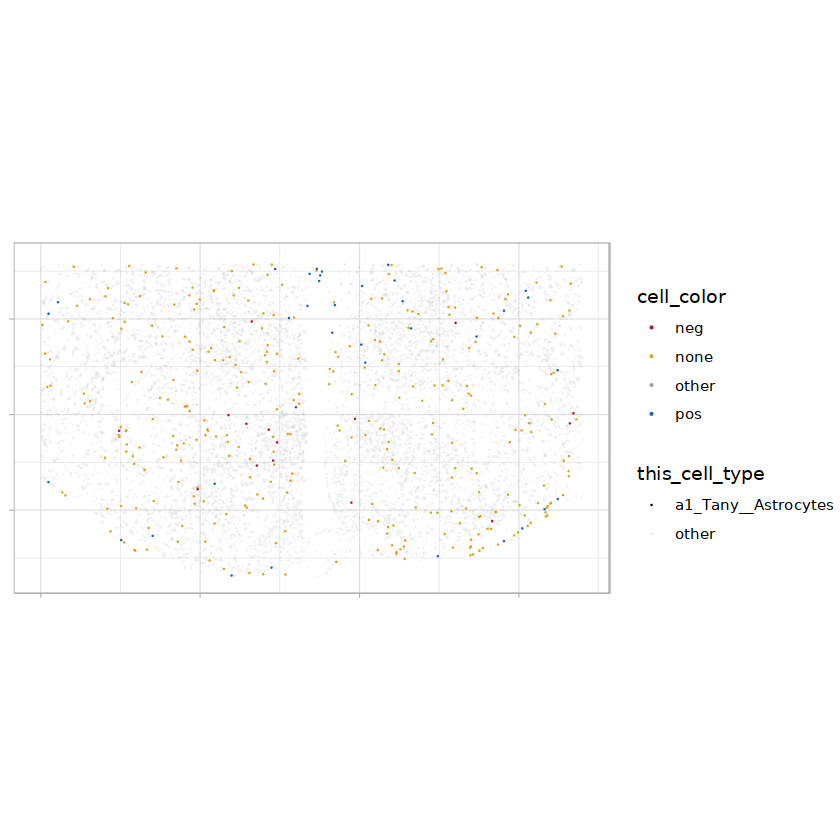

In [58]:
plot_single_slice_label(coord_comparison_df, 'A1', 'a1_Tany__Astrocytes')

In [59]:
plot_all_samples_polarity = function(coord_comparison_df, cell_type){
    p1 = plot_single_slice_label(coord_comparison_df, 'A1', cell_type)
    p2 = plot_single_slice_label(coord_comparison_df, 'A2', cell_type)
    p3 = plot_single_slice_label(coord_comparison_df, 'B1', cell_type)
    p4 = plot_single_slice_label(coord_comparison_df, 'B2', cell_type)
    p5 = plot_single_slice_label(coord_comparison_df, 'C1', cell_type)
    p6 = plot_single_slice_label(coord_comparison_df, 'C2', cell_type)
    p7 = plot_single_slice_label(coord_comparison_df, 'D1', cell_type)
    p8 = plot_single_slice_label(coord_comparison_df, 'D2', cell_type)
    
    layout <- '
    AE
    BF
    CG
    DH
    '

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') 

    ggp
}

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


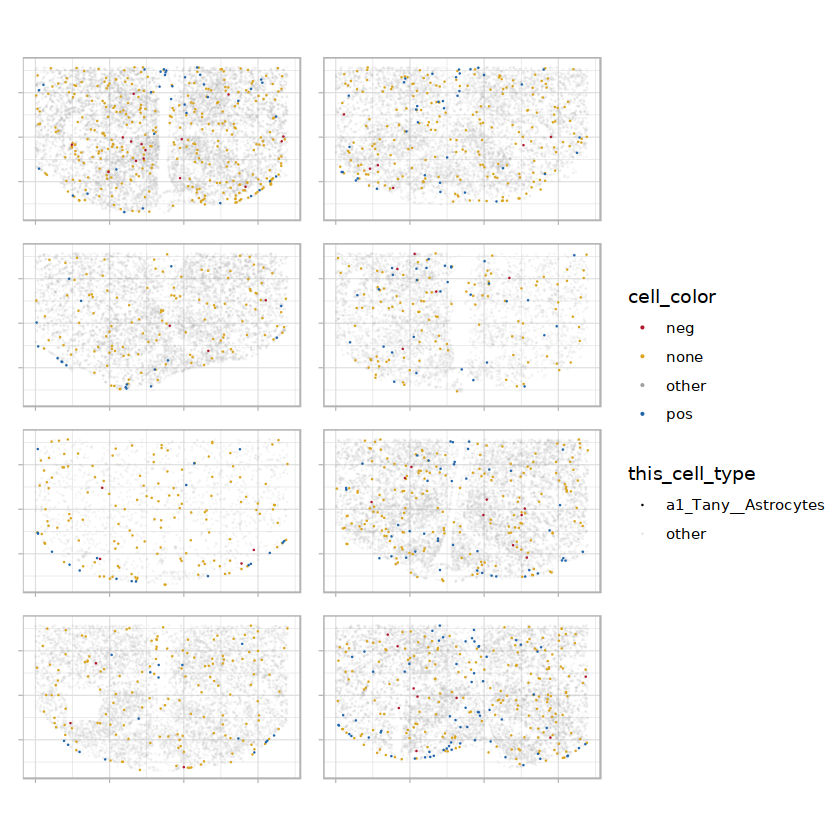

In [60]:
plot_all_samples_polarity(coord_comparison_df, 'a1_Tany__Astrocytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


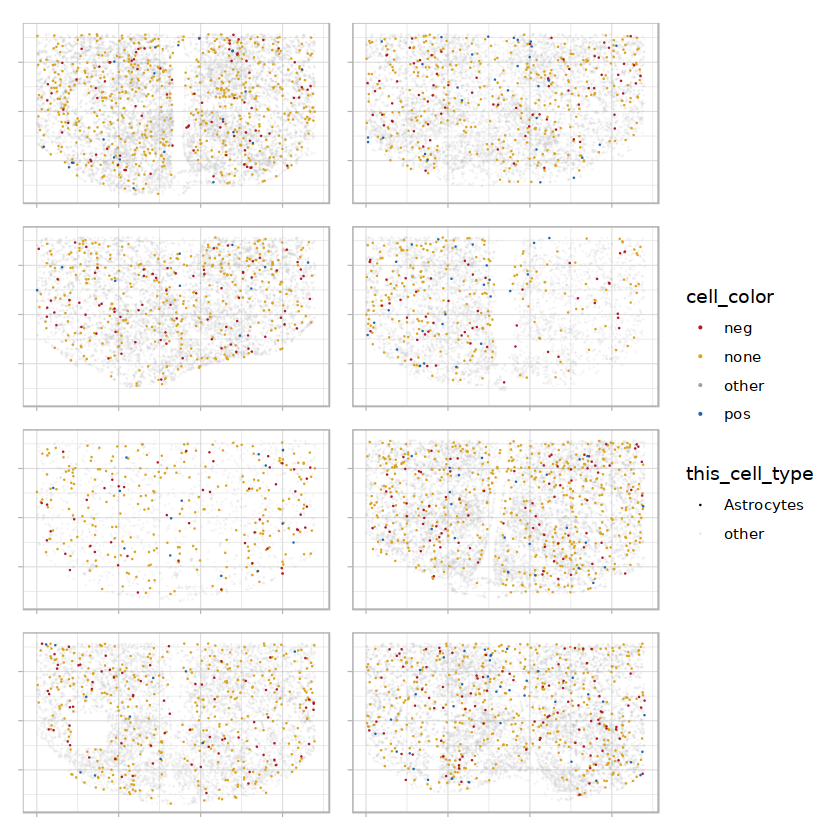

In [61]:
plot_all_samples_polarity(coord_comparison_df, 'Astrocytes')

In [62]:
polarity_sig_df_wide = polarity_sig_df %>%
  pivot_wider(names_from = polarity, 
              values_from = c(pval, coef, z, significant, significant_adj, pval_corrected),
              names_sep = ".")

polarity_sig_df_wide

label,pval.neg,pval.pos,coef.neg,coef.pos,z.neg,z.pos,significant.neg,significant.pos,significant_adj.neg,significant_adj.pos,pval_corrected.neg,pval_corrected.pos
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
Agrp,5.527903e-08,1.742273e-01,-0.81064072,-0.6682101,-5.43343629,-1.358745,**,,**,,3.316742e-07,2.240065e-01
Astrocytes,1.366035e-02,2.231079e-03,0.26609660,0.5956252,2.46607291,3.057612,**,**,**,**,2.458863e-02,6.693237e-03
Htr3b,3.552026e-01,1.041592e-01,-0.23472617,0.8214473,-0.92454516,1.625016,,,,,4.262431e-01,1.442204e-01
MOL,0.000000e+00,6.238113e-03,-6.36591204,0.2632727,-8.00000000,2.734995,**,**,**,**,0.000000e+00,1.403575e-02
NG2_OPC2,4.608746e-02,1.003805e-01,-0.27522269,0.3382501,-1.99459138,1.643012,**,,,,7.541585e-02,1.442204e-01
Sst_Unc13c__Agrp,9.358283e-01,0.000000e+00,-1.72486316,4.2897577,-0.08051425,8.000000,,**,,**,9.358283e-01,0.000000e+00
Trh_Lef1,3.764736e-03,7.867229e-04,-1.07653519,-0.6664574,-2.89723005,-3.357424,**,**,**,**,9.680749e-03,2.832202e-03
a1_Tany__Astrocytes,7.774324e-01,1.211023e-05,-0.07438706,0.6864683,-0.28266668,4.375594,,**,,**,8.746114e-01,5.449602e-05
b1_Tanycytes,9.079596e-01,1.328048e-02,0.03595820,1.2141134,0.11561251,2.476158,,**,,**,9.358283e-01,2.458863e-02


In [63]:
sig_df = ncells_sig_df %>%
left_join(polarity_sig_df_wide, by='label') %>%
# mutate(z.neg = ifelse(is.na(z.neg), 0, z.neg),
#        z.pos = ifelse(is.na(z.pos), 0, z.pos),
#        pval_corrected.neg = ifelse(is.na(pval_corrected.neg), 1, pval_corrected.neg),
#        pval_corrected.pos = ifelse(is.na(pval_corrected.pos), 1, pval_corrected.pos)) %>%
# mutate(sort_col = pval_corrected * pval_corrected.neg * pval_corrected.pos) %>%
# mutate(sort_col = sign(zscore) * abs(zscore * z.pos * z.neg)) %>%
mutate(sort_col = zscore) %>%
arrange(desc(sort_col)) %>%
mutate(label = factor(label, levels=label))


sig_df %>% head

label,pval,coef,zscore,pval_corrected,significant,significant_adj,pval.neg,pval.pos,coef.neg,coef.pos,z.neg,z.pos,significant.neg,significant.pos,significant_adj.neg,significant_adj.pos,pval_corrected.neg,pval_corrected.pos,sort_col
<fct>,<dbl>,<lgl>,<lgl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>
Trh_Cxcl12,1,NA,NA,1,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Slc17a6_Trhr,1,NA,NA,1,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Sst_Unc13c__Agrp,1,NA,NA,1,,,0.9358283,0,-1.724863,4.289758,-0.08051425,8,,**,,**,0.9358283,0,NA
Unassigned2,1,NA,NA,1,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Tbx19,1,NA,NA,1,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Pomc_Lepr,1,NA,NA,1,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [64]:
sig_df = sig_df %>%
mutate(significant_adj.neg = case_when(label == 'Trh_Lef1' ~ '',
                                       TRUE ~ significant_adj.neg)) %>%
mutate(significant_adj.pos = case_when(label == 'Agrp' ~ '',
                                       TRUE ~ significant_adj.pos))


In [65]:
options(repr.plot.width=3.5, repr.plot.height=11)

# Convert 'label' column to a factor
sig_df$label <- as.factor(sig_df$label)

# Define conditions for colors
sig_df$zscore_col <- ifelse(sig_df$zscore > 0 & sig_df$significant_adj == '**', "#2166ac",
                            ifelse(sig_df$zscore < 0 & sig_df$significant_adj == '**', "#b2182b", "#a1a1a1"))
sig_df$zpos_col <- ifelse(sig_df$z.pos > 0 & sig_df$significant_adj.pos == '**', "#2166ac",
                         ifelse(sig_df$z.pos < 0 & sig_df$significant_adj.pos == '**', "#b2182b", "#a1a1a1"))
sig_df$zneg_col <- ifelse(sig_df$z.neg > 0 & sig_df$significant_adj.neg == '**', "#2166ac",
                         ifelse(sig_df$z.neg < 0 & sig_df$significant_adj.neg == '**', "#b2182b", "#a1a1a1"))

# Create the scatter plot
ggp_sig = ggplot(sig_df) +
  # Add a scatter plot for 'zscore'
  geom_point(aes(y = label, x = zscore, color = zscore_col), shape = 'o', size = 5) +
  # Add a scatter plot for 'z.pos'
  geom_point(aes(y = label, x = z.pos, color = zpos_col), shape = '+', size = 5) +
  # Add a scatter plot for 'z.neg'
  geom_point(aes(y = label, x = z.neg, color = zneg_col), shape = '|', size = 5) +
  # Specify the colors for each condition
  scale_color_identity() +
  # Set the x-axis limits
  scale_x_continuous(limits = c(-8, 8)) +
  # Add the plot title and labels
  labs(x = "Z") +
  # Set the plot theme
  theme_minimal()

ggp_sig

ERROR while rich displaying an object: Error: Discrete value supplied to continuous scale

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6. repr::mime2repr[[mime]](obj)
7. repr_text.default(obj)
8. paste(capture.output(print(ob

In [66]:
sig_df %>% filter(label == 'Agrp') %>% select(label, zscore,  zscore_col, z.neg, zneg_col, z.pos,  zpos_col)

label,zscore,zscore_col,z.neg,zneg_col,z.pos,zpos_col
<fct>,<lgl>,<chr>,<dbl>,<chr>,<dbl>,<chr>
Agrp,NA,#a1a1a1,-5.433436,#b2182b,-1.358745,#a1a1a1


In [67]:
plot_all_samples_polarity_2row = function(coord_comparison_df, cell_type, pt_size=0.2){
    p1 = plot_single_slice_label(coord_comparison_df, 'A1', cell_type, pt_size=pt_size) + theme(legend.position = "none") + labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label(coord_comparison_df, 'A2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p3 = plot_single_slice_label(coord_comparison_df, 'B1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p4 = plot_single_slice_label(coord_comparison_df, 'B2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p5 = plot_single_slice_label(coord_comparison_df, 'C1', cell_type, pt_size=pt_size) + theme(legend.position = "none") + labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label(coord_comparison_df, 'C2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p7 = plot_single_slice_label(coord_comparison_df, 'D1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p8 = plot_single_slice_label(coord_comparison_df, 'D2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    label_plot <- ggplot() +
      labs(y = cell_type) +
      theme_void()

    
    layout <- '
    ABCD
    EFGH
    '

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp
}

In [68]:
p_Microglia = plot_all_samples_polarity_2row(coord_comparison_df, 'Microglia')
p_MOL = plot_all_samples_polarity_2row(coord_comparison_df, 'MOL')
p_Trh_Lef1 = plot_all_samples_polarity_2row(coord_comparison_df, 'Trh_Lef1')
p_Astrocytes = plot_all_samples_polarity_2row(coord_comparison_df, 'Astrocytes')
p_a1_Tany__Astrocytes = plot_all_samples_polarity_2row(coord_comparison_df, 'a1_Tany__Astrocytes')
p_a2_Tanycytes = plot_all_samples_polarity_2row(coord_comparison_df, 'a2_Tanycytes')
p_NFOL = plot_all_samples_polarity_2row(coord_comparison_df, 'NFOL')
p_Agrp = plot_all_samples_polarity_2row(coord_comparison_df, 'Agrp')
p_Rgs16_Dlx1 = plot_all_samples_polarity_2row(coord_comparison_df, 'Rgs16_Dlx1')

In [69]:
options(repr.plot.width=8.5, repr.plot.height=11)
layout <- '
ABBBBBB
ACCCCCC
ADDDDDD
AEEEEEE
AFFFFFF
AGGGGGG
AHHHHHH
'

ggp = wrap_plots(A = ggp_sig,
           B = p_Microglia,
           C = p_MOL,
           D = p_Trh_Lef1,
           E = p_Astrocytes,
           F = p_a1_Tany__Astrocytes,
           G = p_a2_Tanycytes,
           H = p_NFOL,
    design = layout) +
plot_layout(guides = 'auto') 

In [70]:
options(repr.plot.width=8.5, repr.plot.height=11)
layout <- '
ABBBBBB
ACCCCCC
ADDDDDD
AEEEEEE
AGGGGGG
'

ggp = wrap_plots(A = ggp_sig,
           B = p_Rgs16_Dlx1 ,
           C = p_Agrp,
           D = p_MOL,
           E = p_a1_Tany__Astrocytes,
           G = p_NFOL,
    design = layout) +
plot_layout(guides = 'auto') 

In [71]:
ggp %>% ggsave("spatial_sig_plots.pdf", ., width = 7, height = 9)

ERROR: Error: Discrete value supplied to continuous scale


In [72]:
ggp %>% ggsave("spatial_sig_plots.png", ., width = 8.5, height = 11)

ERROR: Error: Discrete value supplied to continuous scale


In [73]:
plot_single_slice_label_ct = function(coord_comparison_df, sample, cell_type, pt_size=0.1){
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(label == cell_type ~ !!cell_type,
                                          TRUE ~ 'other'),
               polarity_factor = factor(polarity, levels = c('none', 'neg', 'pos')),
               cell_type_factor = factor(label == cell_type, levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(polarity))) %>%
        arrange(cell_type_factor, polarity_factor) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(values = c('none' =  "#000000",
                                        'pos' = "#000000",
                                        'neg' = "#000000",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = setNames(c("other" = 16, "this" = 16), c("other", cell_type))) +
          scale_alpha_manual(values = setNames(c("other" = 0.1, "this" = 1), c("other", cell_type))) +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank()    # Remove y-axis labels
        )
    
    ggp
}


Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”


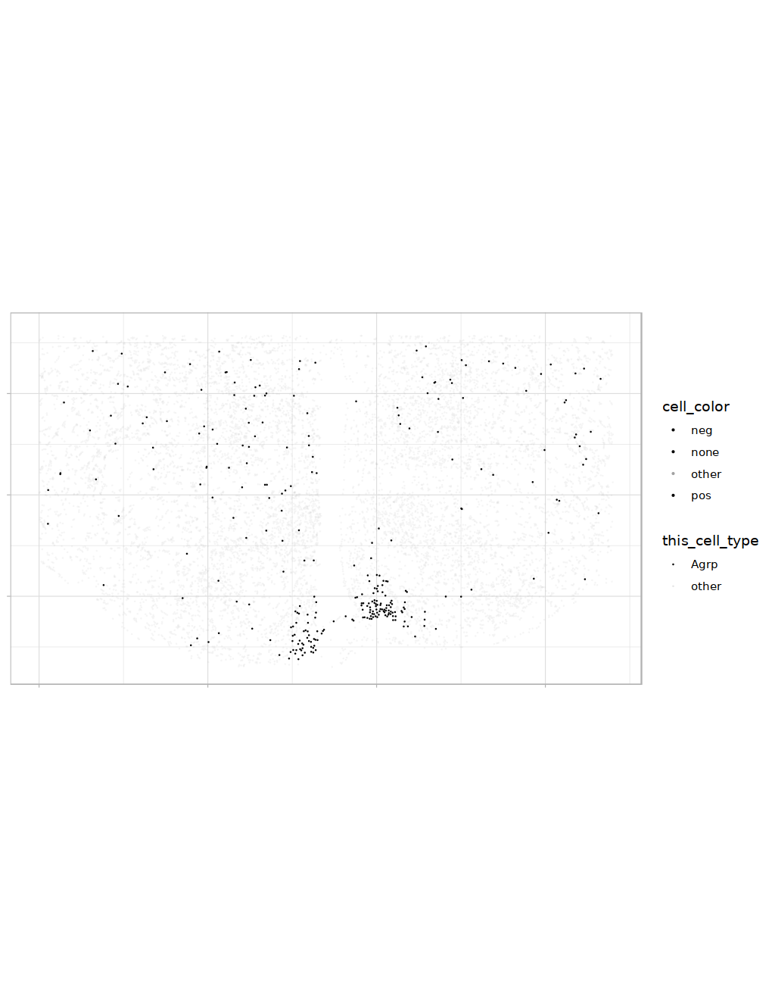

In [74]:
plot_single_slice_label_ct(coord_comparison_df, 'A1', 'Agrp')

In [75]:
plot_all_samples_ct_2col = function(coord_comparison_df, cell_type, pt_size=0.2){
    p1 = plot_single_slice_label_ct(coord_comparison_df, 'A1', cell_type, pt_size=pt_size) + theme(legend.position = "none") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct(coord_comparison_df, 'A2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p3 = plot_single_slice_label_ct(coord_comparison_df, 'B1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p4 = plot_single_slice_label_ct(coord_comparison_df, 'B2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p5 = plot_single_slice_label_ct(coord_comparison_df, 'C1', cell_type, pt_size=pt_size) + theme(legend.position = "none") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct(coord_comparison_df, 'C2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p7 = plot_single_slice_label_ct(coord_comparison_df, 'D1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p8 = plot_single_slice_label_ct(coord_comparison_df, 'D2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    label_plot <- ggplot() +
      labs(y = cell_type) +
      theme_void()

    
    layout <- '
AE
BF
CG
DH
'

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp
}

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


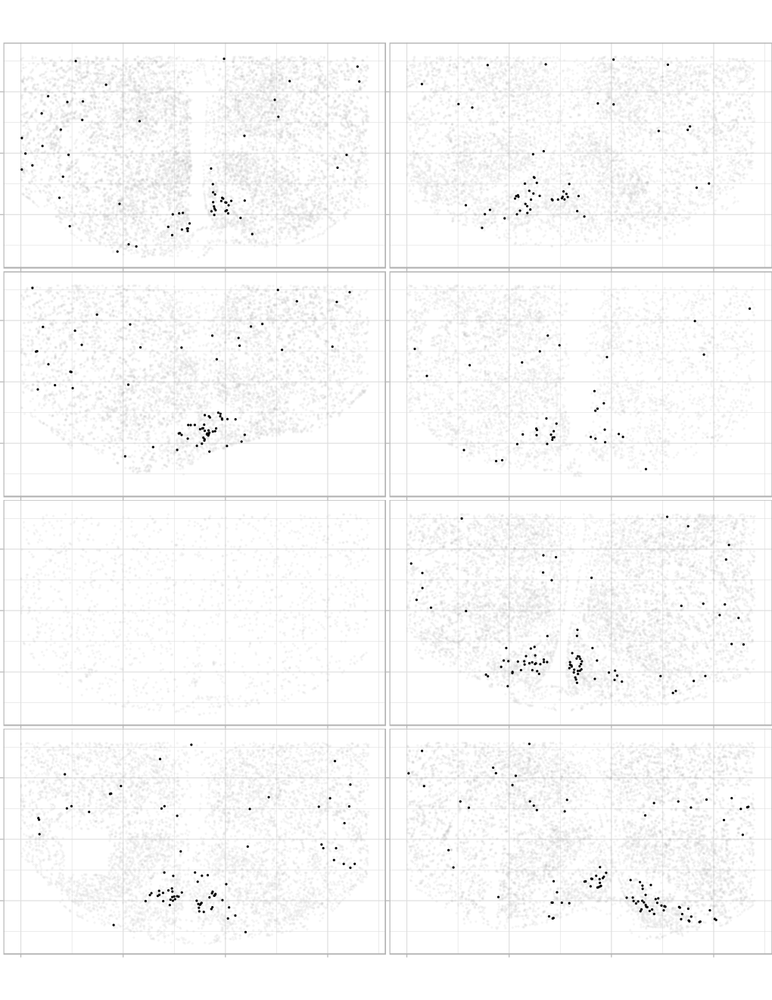

In [76]:
plot_all_samples_ct_2col(coord_comparison_df, 'Sst_Unc13c__Agrp', pt_size=0.3)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


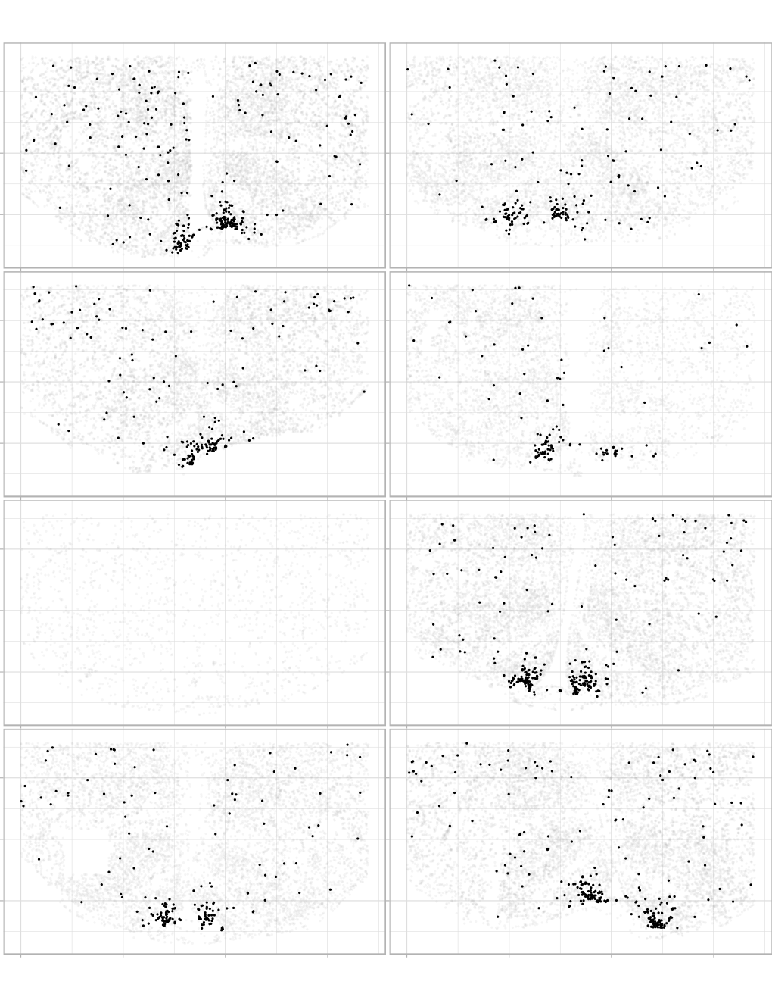

In [77]:
plot_all_samples_ct_2col(coord_comparison_df, 'Agrp', pt_size=0.3)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


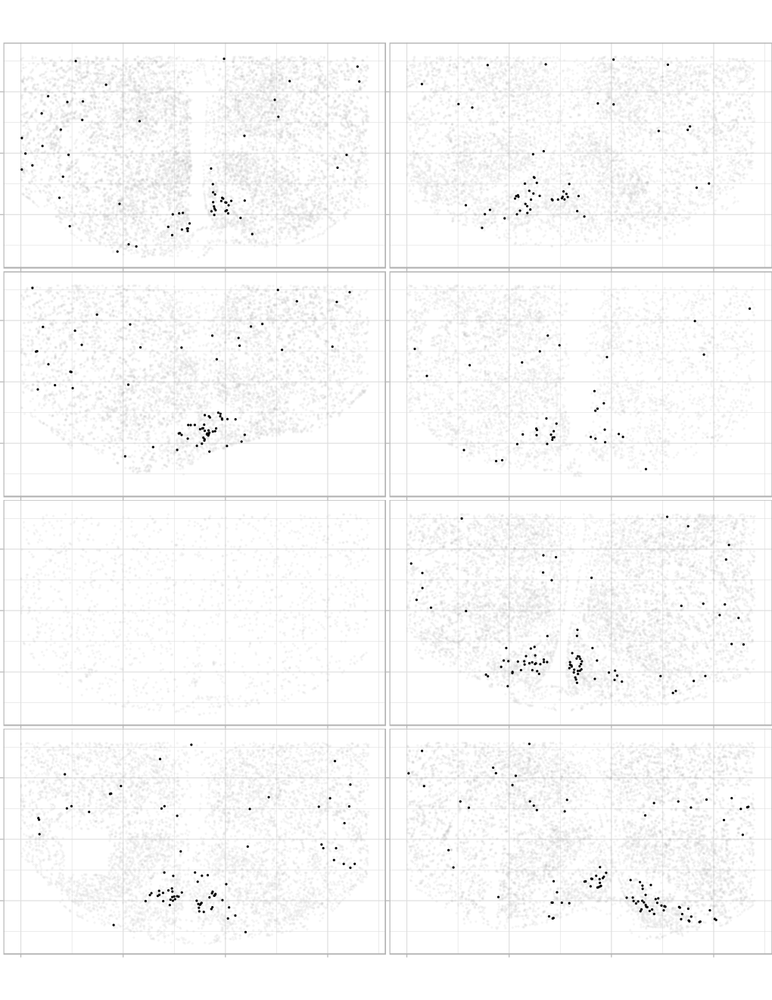

In [78]:
plot_all_samples_ct_2col(coord_comparison_df, 'Sst_Unc13c__Agrp', pt_size=0.3)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


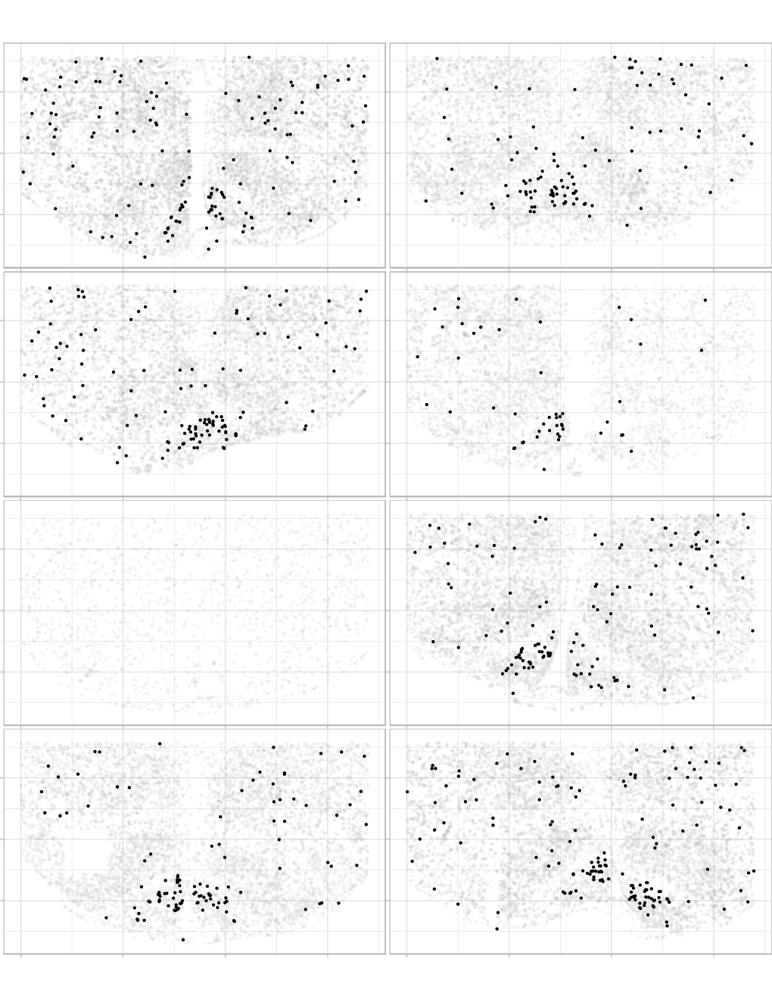

In [79]:
plot_all_samples_ct_2col(coord_comparison_df, 'Htr3b', pt_size=0.6)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


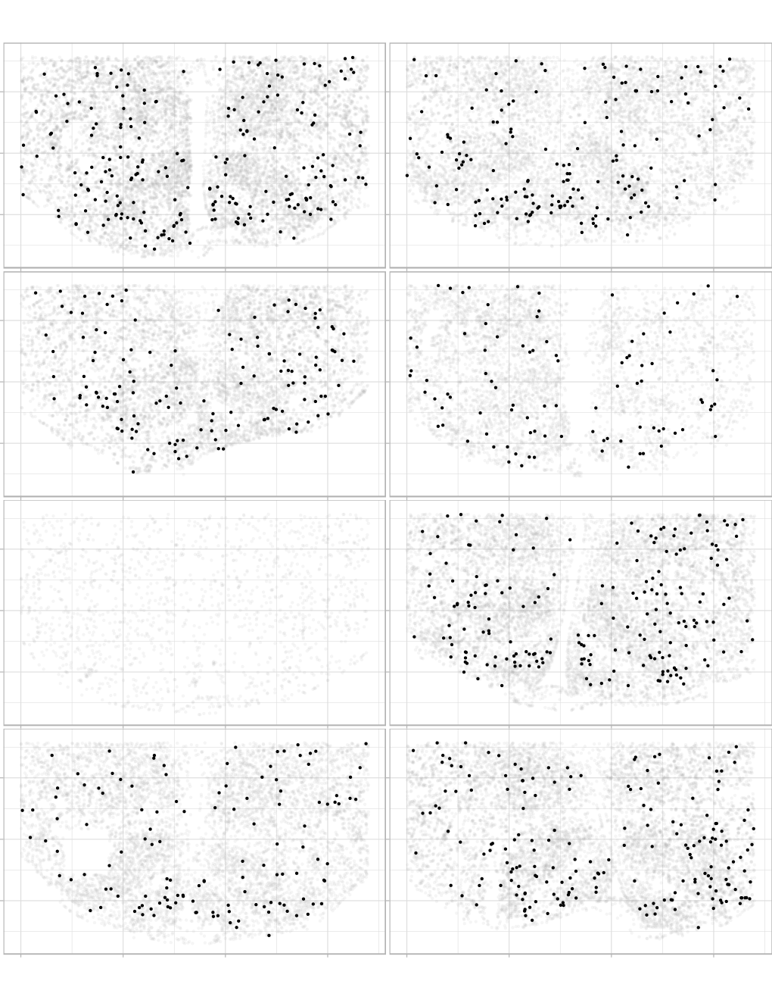

In [80]:
plot_all_samples_ct_2col(coord_comparison_df, 'Pomc_Glipr1__Slc17a6_Trhr', pt_size=0.6)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


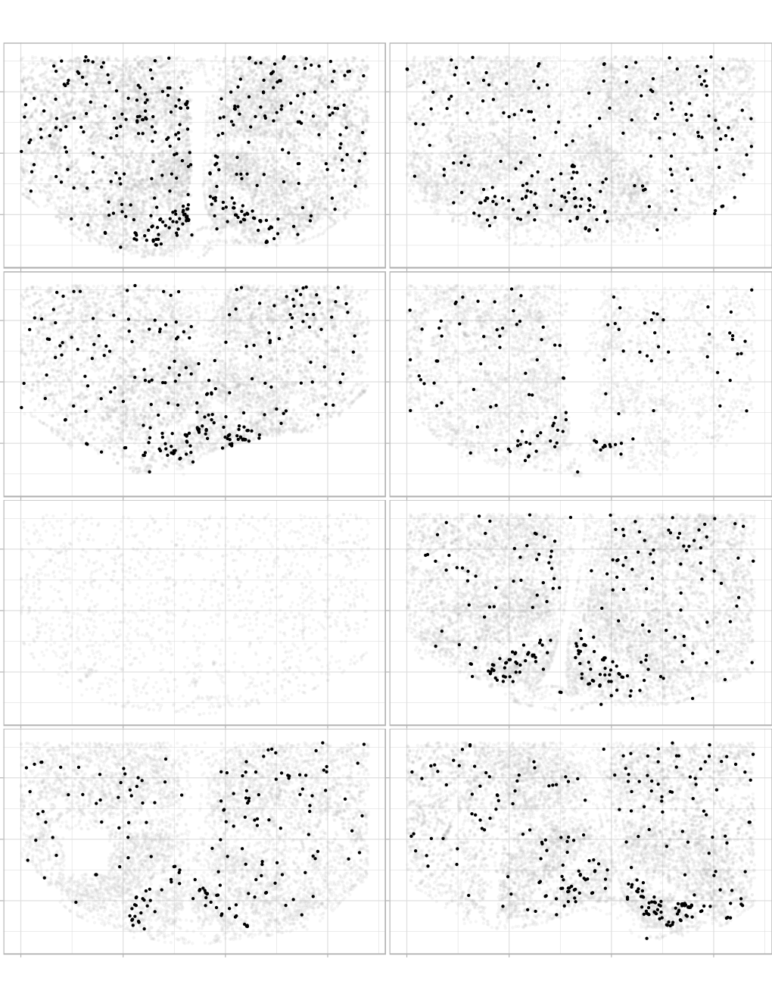

In [81]:
plot_all_samples_ct_2col(coord_comparison_df, 'Pomc_Lepr', pt_size=0.6)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


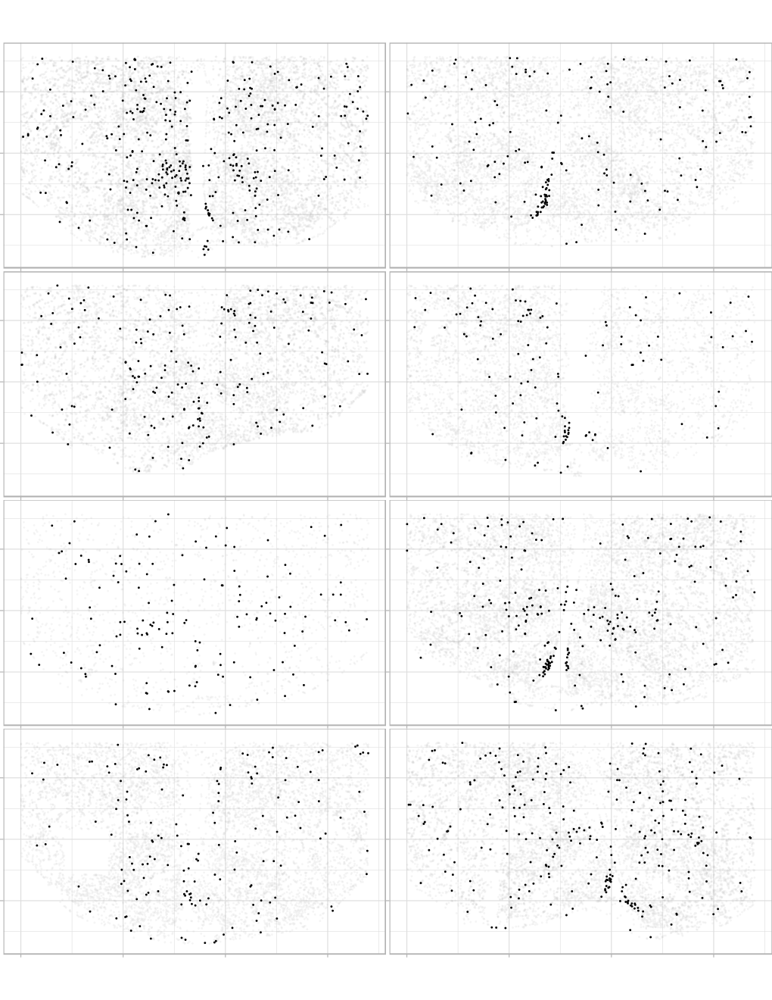

In [82]:
plot_all_samples_ct_2col(coord_comparison_df, 'a2_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


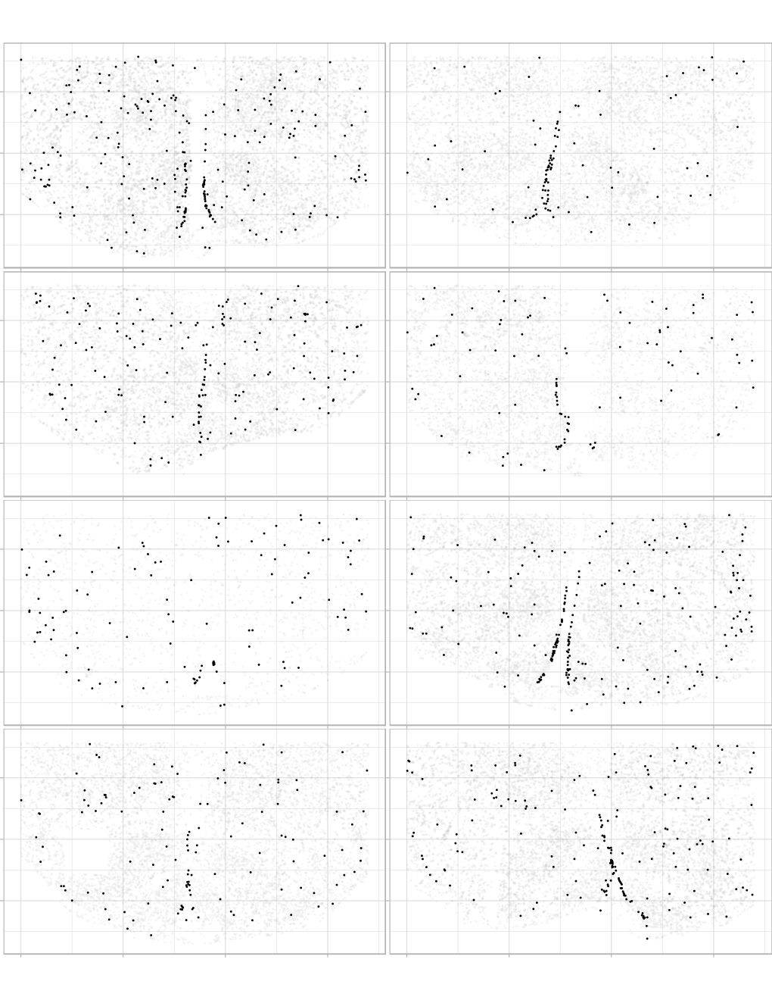

In [83]:
plot_all_samples_ct_2col(coord_comparison_df, 'b1_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


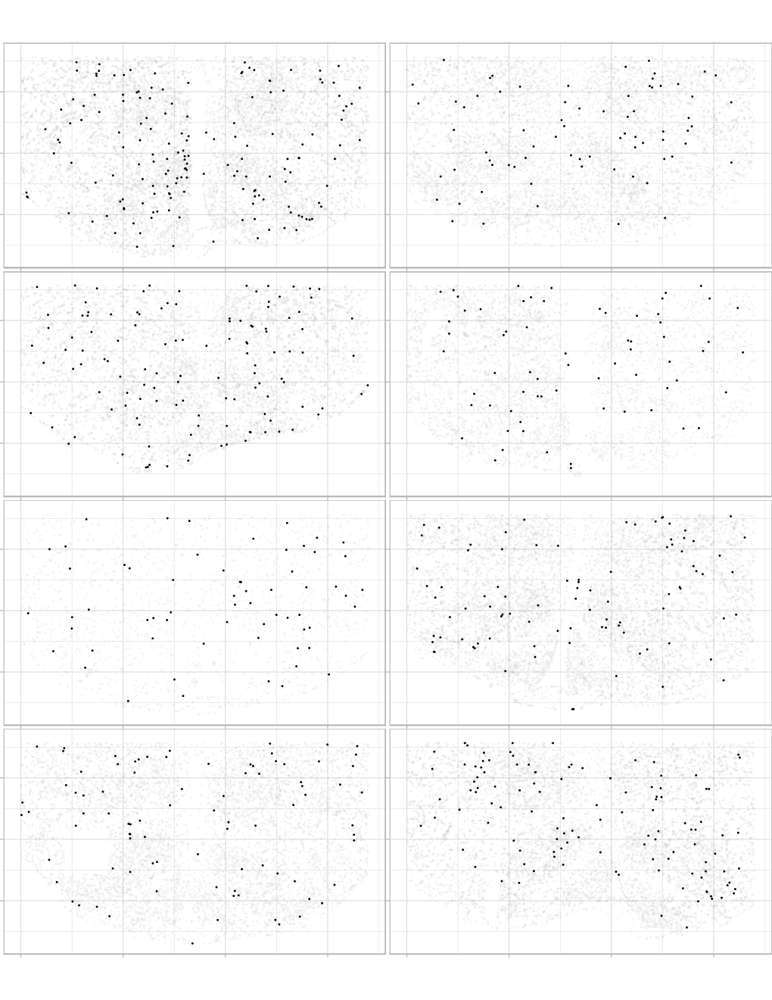

In [84]:
plot_all_samples_ct_2col(coord_comparison_df, 'a2_Tanycytes__b1_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


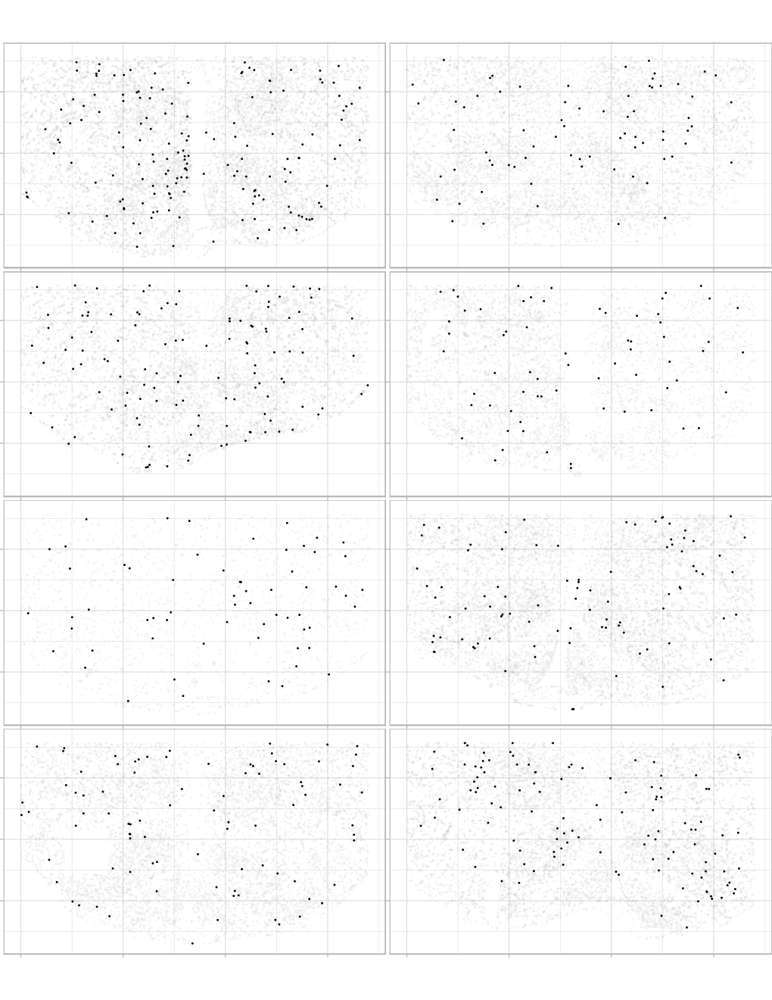

In [85]:

plot_all_samples_ct_2col(coord_comparison_df, 'a2_Tanycytes__b1_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


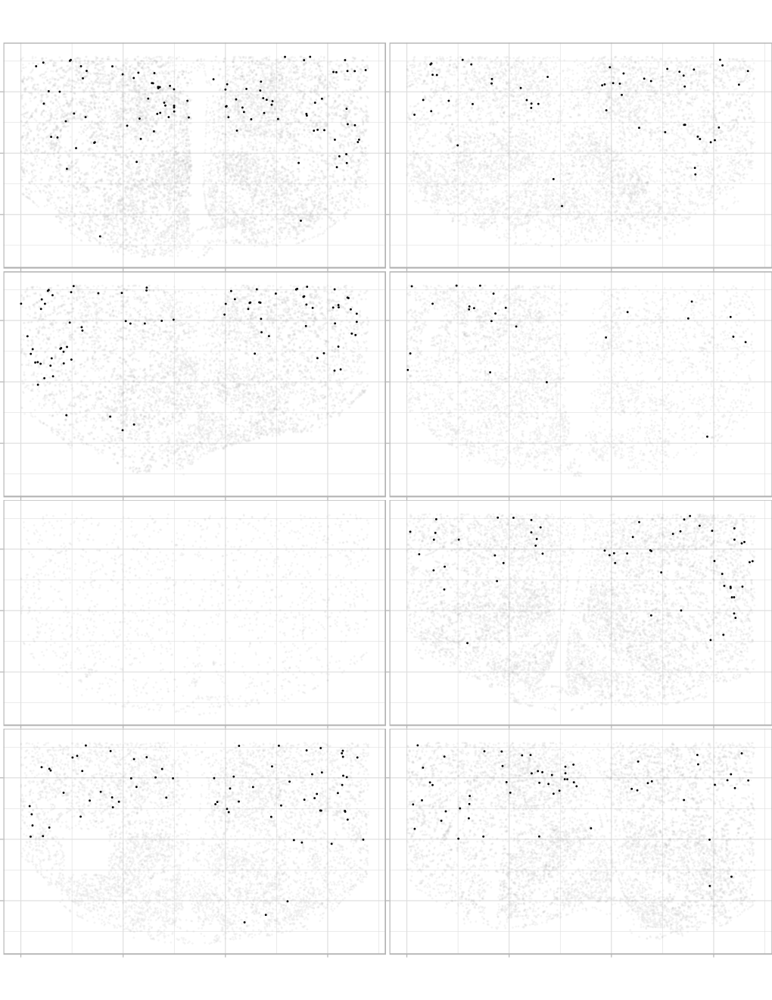

In [86]:

plot_all_samples_ct_2col(coord_comparison_df, 'Rgs16_Dlx1')

In [87]:
plot_single_slice_label_ct_tany = function(coord_comparison_df, sample, pt_size=0.1){
    tany_regex = "^(a2_Tanycytes|a2_Tanycytes__b1_Tanycytes|b1_Tanycytes|b2_Tany|a1_Tany__Astrocytes)$"
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(str_detect(label, tany_regex) ~ label,
                                          TRUE ~ 'other'),
               cell_type_factor = factor(str_detect(label, tany_regex), levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(this_cell_type))) %>%
        arrange(cell_type_factor) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(name = 'cell type',
                             values = c('a2_Tanycytes' =  "#af8dc3",
                                        'a2_Tanycytes__b1_Tanycytes' = "#e7d4e8",
                                        'b1_Tanycytes' = "#7fbf7b",
                                        'b2_Tany' = "#1b7837",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = c("other" = 16,
                                        'a2_Tanycytes' = 16,
                                        'a2_Tanycytes__b1_Tanycytes' = 16,
                                        'b1_Tanycytes' = 16,
                                        'b2_Tany' = 16),
                             guide = 'none') +
          scale_alpha_manual(values = c("other" = 0.1,
                                        'a2_Tanycytes' = 1,
                                        'a2_Tanycytes__b1_Tanycytes' = 1,
                                        'b1_Tanycytes' = 1,
                                        'b2_Tany' = 1),
                             guide='none') +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank(),    # Remove y-axis labels
              legend.position = "right", 
              legend.key.size = unit(0.3, "cm"),
              legend.text = element_text(lineheight=0.5, size = 6)

        )
    
    ggp
}


Warning message:
“Removed 424 rows containing missing values (`geom_point()`).”


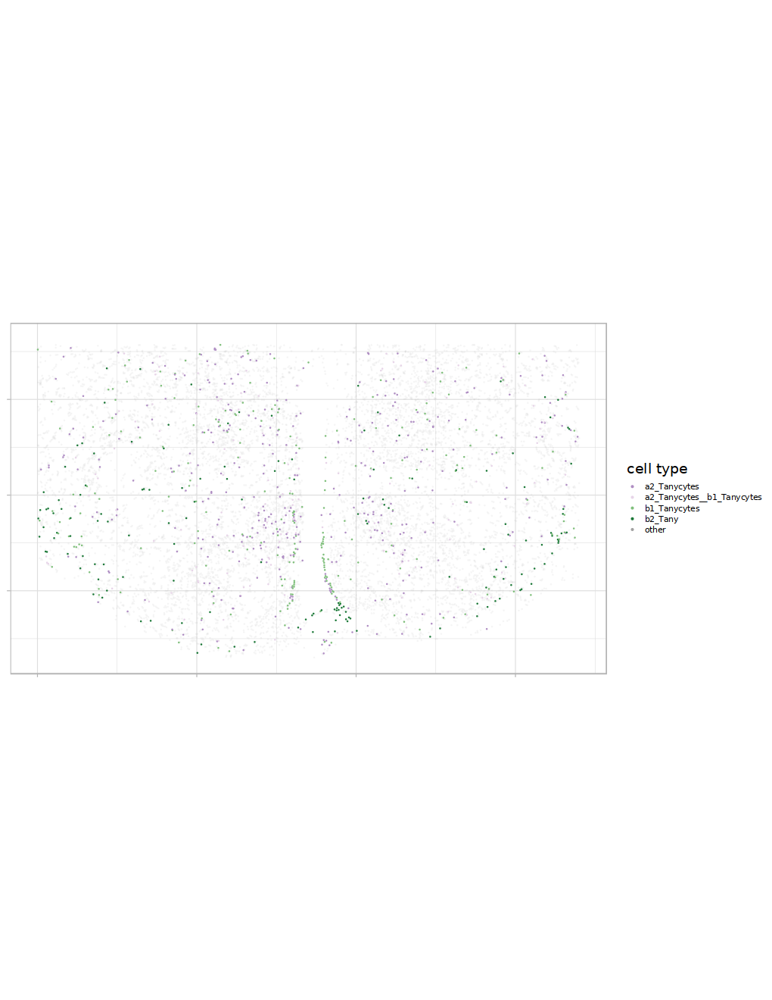

In [88]:
plot_single_slice_label_ct_tany(coord_comparison_df, 'A1')

In [89]:
plot_all_samples_ct_tany = function(coord_comparison_df, pt_size=0.1, plot_shape='2col'){
    p1 = plot_single_slice_label_ct_tany(coord_comparison_df, 'A1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct_tany(coord_comparison_df, 'A2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p3 = plot_single_slice_label_ct_tany(coord_comparison_df, 'B1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p4 = plot_single_slice_label_ct_tany(coord_comparison_df, 'B2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p5 = plot_single_slice_label_ct_tany(coord_comparison_df, 'C1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct_tany(coord_comparison_df, 'C2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p7 = plot_single_slice_label_ct_tany(coord_comparison_df, 'D1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p8 = plot_single_slice_label_ct_tany(coord_comparison_df, 'D2', pt_size=pt_size) #+ theme(legend.position = "bottom")

if (plot_shape == '2col'){
        layout <- '
AE
BF
CG
DH
'
}
if (plot_shape == '2row'){
            layout <- '
ABCD
EFGH
'
p1 = p1 + labs(y = paste0('Tanycytes', '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
p5 = p5 + labs(y = paste0('Tanycytes', '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
}


    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0),
#            legend.position = "bottom")
                       legend.position = "right")

    ggp
}

Warning message:
“Removed 424 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 158 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 227 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 283 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 160 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 279 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 326 rows containing missing values (`geom_point()`).”


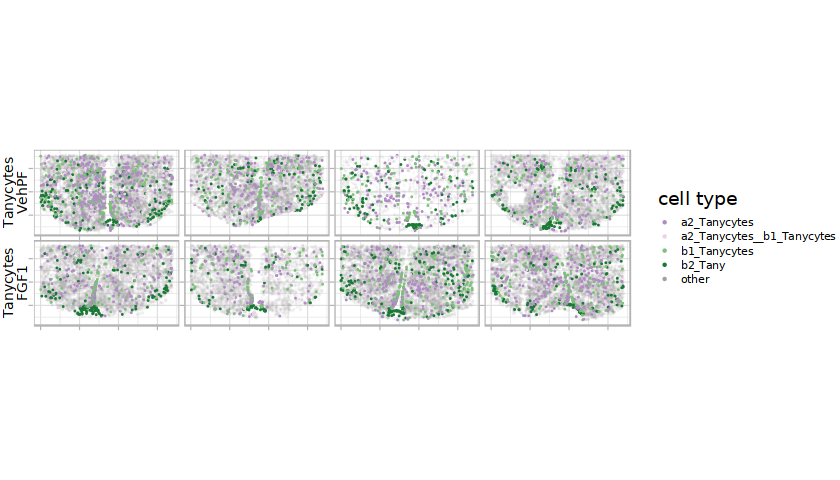

In [104]:
options(repr.plot.width=7, repr.plot.height=4)
tany_plot = plot_all_samples_ct_tany(coord_comparison_df, pt_size=0.2, plot_shape='2row')
tany_plot

In [91]:
plot_single_slice_label_ct_neurons = function(coord_comparison_df, sample, pt_size=0.1){
    tany_regex = "^(Agrp|Sst_Unc13c__Agrp|Pomc_Lepr|Pomc_Glipr1__Slc17a6_Trhr|Htr3b|Nr5a1_Bdnf)$"
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(str_detect(label, tany_regex) ~ label,
                                          TRUE ~ 'other'),
               cell_type_factor = factor(str_detect(label, tany_regex), levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(this_cell_type))) %>%
        mutate(cell_color = factor(cell_color, levels=c("other", "Pomc_Glipr1__Slc17a6_Trhr", "Sst_Unc13c__Agrp",  "Htr3b", "Pomc_Lepr", "Agrp", "Nr5a1_Bdnf"))) %>%
        arrange(cell_color) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(name = 'cell type',
                             values = c('Sst_Unc13c__Agrp' =  "#a6cee3",
                                        'Agrp' = "#1f78b4",
#                                         'Pomc_Glipr1__Slc17a6_Trhr' = "#33a02c", #"#b2df8a",
                                        'Pomc_Lepr' = "#33a02c",
                                        'Htr3b' = '#e31a1c',
                                        'Nr5a1_Bdnf' = '#fdbf6f',
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = c('Agrp' =  16,
                                        'Sst_Unc13c__Agrp' = 16,
                                        'Pomc_Lepr' = 16,
#                                         'Pomc_Glipr1__Slc17a6_Trhr' = 16,
                                        'Htr3b' = 16,
                                        'Nr5a1_Bdnf' = 16,
                                        'other' = 16), guide = 'none') +
          scale_alpha_manual(values = c('Agrp' =  1,
                                        'Sst_Unc13c__Agrp' = 1,
                                        'Pomc_Lepr' = 1,
#                                         'Pomc_Glipr1__Slc17a6_Trhr' = 1,
                                        'Htr3b' = 1,
                                        'Nr5a1_Bdnf' = 1,
                                        'other' = 0.1), guide = 'none') +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank(),    # Remove y-axis labels
              legend.position = "right", 
              legend.key.size = unit(0.3, "cm"),
              legend.text = element_text(lineheight=0.5, size = 6)
        )
    
    ggp
}


In [92]:
names(c('Sst_Unc13c__Agrp' =  "#a6cee3",
                                        'Agrp' = "#1f78b4",
                                        'Pomc_Glipr1__Slc17a6_Trhr' = "#33a02c", #"#b2df8a",
#                                         'Pomc_Lepr' = "#33a02c",
                                        'Htr3b' = '#e31a1c',
                                        'Nr5a1_Bdnf' = '#fdbf6f',
                                        'other' = "#a1a1a1")) %>% rev %>%dput

c("other", "Nr5a1_Bdnf", "Htr3b", "Pomc_Glipr1__Slc17a6_Trhr", 
"Agrp", "Sst_Unc13c__Agrp")


In [93]:
plot_all_samples_ct_neurons = function(coord_comparison_df, pt_size=0.2, plot_shape='2col'){
    p1 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'A1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'A2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p3 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'B1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p4 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'B2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p5 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'C1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'C2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p7 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'D1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p8 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'D2', pt_size=pt_size) #+ theme(legend.position = "bottom")

if (plot_shape == '2col'){
        layout <- '
AE
BF
CG
DH
'
}
if (plot_shape == '2row'){
            layout <- '
ABCD
EFGH
'
p1 = p1 + labs(y = paste0('Neurons', '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
p5 = p5 + labs(y = paste0('Neurons', '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
}


    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0),
#            legend.position = "bottom")
            )
    ggp
}

Warning message:
“Removed 286 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 194 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 211 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 112 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 248 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 251 rows containing missing values (`geom_point()`).”


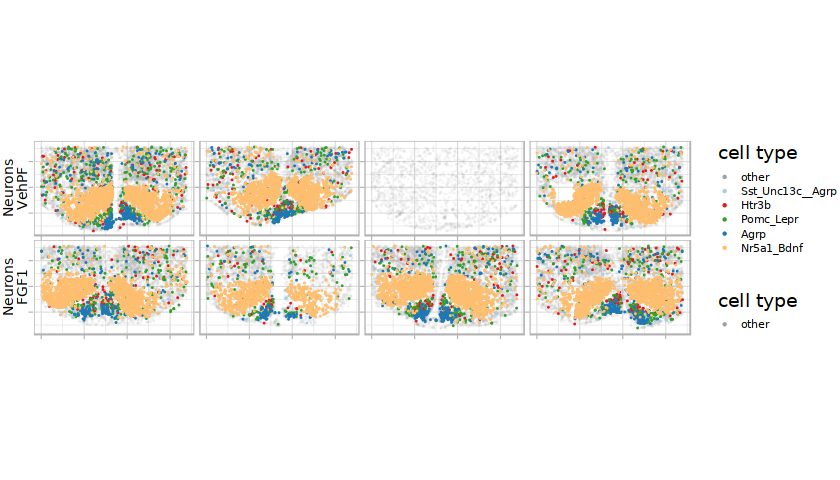

In [94]:
options(repr.plot.width=7, repr.plot.height=4)
neurons_plot = plot_all_samples_ct_neurons(coord_comparison_df, pt_size=0.2, plot_shape='2row')
neurons_plot

In [95]:
obj_fgf1 = qs::qread('obj_fgf1_obob5v5.qs')
obj_fgf1

Loading required package: Seurat



An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [96]:
xe_obj = qs::qread(xe_obj_path)

xe_obj@meta.data = xe_obj@meta.data %>%
mutate(predicted.polar_label = polar_label)

xe_obj@meta.data = xe_obj %>% `[[` %>%
mutate(base_label = predicted.polar_label %>% str_replace(fixed('.neg'), '') %>% str_replace(fixed('.none'), '') %>% str_replace(fixed('.pos'), ''))

xe_obj@meta.data = xe_obj@meta.data %>% mutate(base_label = str_replace(base_label, fixed('__'), '\n'))

In [97]:
xe_obj %>% `[[` %>% distinct(base_label) %>% pull(base_label)

[1] "Trh_Cxcl12"                 "Slc17a6_Trhr"              
 [3] "Sst_Unc13c\nAgrp"           "Unassigned2"               
 [5] "Tbx19"                      "Pomc_Lepr"                 
 [7] "Rgs16_Nmu"                  "Kisspeptin"                
 [9] "Gm8773_Tac1\nHdc"           "Rgs16_Dlx1\nUnassigned2"   
[11] "Unassigned1.sc17.sc28"      "Nr5a1_Bdnf"                
[13] "Htr3b"                      "Tmem215"                   
[15] "Slc17a6_Fam19a2"            "Unassigned1.sc39"          
[17] "Unassigned1.sc37"           "Nr5a1_Nfib"                
[19] "Sst_Pthlh.sc21"             "Ghrh"                      
[21] "Th_Nfib\nArx_Nr5a2"         "Trh_Lef1"                  
[23] "Nr5a1_Bdnf\nUnassigned1"    "Oxt\nUnassigned1"          
[25] "Pomc_Glipr1\nSlc17a6_Trhr"  "Qrfp"                      
[27] "Agrp"                       "Nr5a1_Bdnf\nNr5a1_Nfib"    
[29] "Sst_Pthlh.sc23"             "Rgs16_Dlx1"                
[31] "Sst_Nts"                    "Nfix_Htr2c"                
[33] "Gpr50"                      "Th_Slc6a3"                 
[35] "Sst_Pthlh\nGhrh"            "Unassigned2\nUnassigned1"  
[37] "a1_Tany\nAstrocytes"        "a2_Tanycytes"              
[39] "MOL"                        "b1_Tanycytes"              
[41] "Astrocytes"                 "a2_Tanycytes\nb1_Tanycytes"
[43] "NG2_OPC2"                   "NFOL"                      
[45] "Epend"                      "Endothelial"               
[47] "b2_Tany"                    "NG2_OPC2\nMicroglia"       
[49] "Microglia"                  "Fibroblasts2\nFibroblasts3"
[51] "Parstuber2A\nParsTuber1"    "Mural_Cells2"              
[53] "MOL\na2_Tanycytes"

In [98]:
obj_fgf1 %>% `[[` %>% colnames

[1] "orig.ident"                    "nCount_RNA"                   
 [3] "nFeature_RNA"                  "Index.10x"                    
 [5] "nCount_HTO"                    "nFeature_HTO"                 
 [7] "Index.HTO"                     "nCount_spliced"               
 [9] "nFeature_spliced"              "nCount_unspliced"             
[11] "nFeature_unspliced"            "HTO_mcl_maxID"                
[13] "HTO_mcl_secondID"              "HTO_mcl_margin"               
[15] "HTO_mcl_classification"        "HTO_mcl_classification.global"
[17] "hash.mcl.ID"                   "doublet"                      
[19] "predicted_dub_std"             "predicted_dub_cut"            
[21] "predicted_dub_all"             "nCount_SCT"                   
[23] "nFeature_SCT"                  "SCT_snn_res.0.8"              
[25] "seurat_clusters"               "strain"                       
[27] "treatment"                     "time"                         
[29] "collection_date"               "isolation_date"               
[31] "batch"                         "predicted.id"                 
[33] "prediction.score.max"          "labels"                       
[35] "cell_class"                    "polar_label"                  
[37] "nCount_integrated"             "nFeature_integrated"

Warning message:
“Removed 286 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 194 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 211 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 112 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 248 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 251 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 424 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 158 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 227 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 283 rows contain

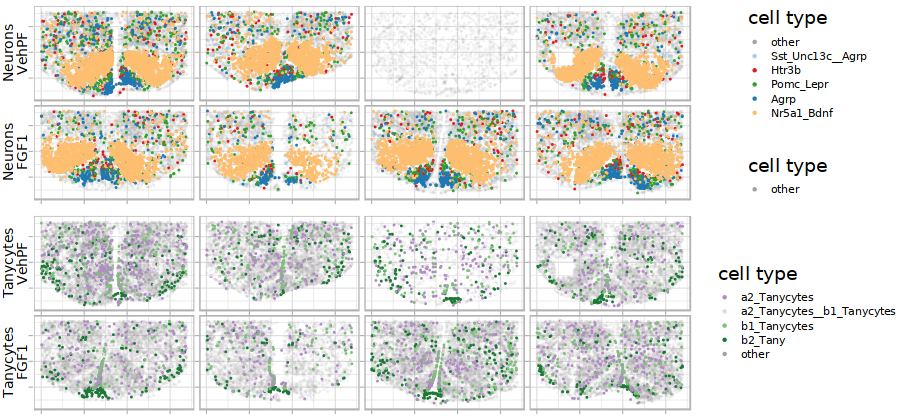

In [99]:
options(repr.plot.width=7.5, repr.plot.height=3.5)
layout <- '
B
B
C
C
'
ggp = wrap_plots(B = neurons_plot,
                 C = tany_plot,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp

In [100]:
ggp %>% ggsave("label_transfer_spatial_only.pdf", ., width = 7.5, height = 3.5)

Warning message:
“Removed 286 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 194 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 211 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 112 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 248 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 251 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 424 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 158 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 227 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 283 rows contain

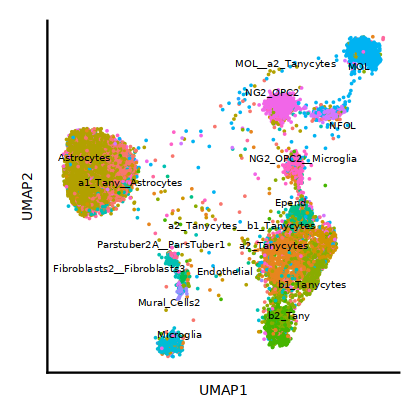

In [101]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_other_2s_uni')
options(repr.plot.width=3.5, repr.plot.height=3.5)
umap_other = DimPlot(xe_obj, pt.size= 0.0001, reduction = "ref.umap", group.by = "labels", label = TRUE, repel = TRUE, raster=FALSE, label.size=2) +
theme(legend.position = "none")  +
labs(title = "Molecular cartography cells on snRNA-seq UMAP",
     x = 'UMAP1', y='UMAP2') + 
theme(plot.title = element_blank(),
#       plot.title = element_text(size = 8),
      axis.title.y = element_text(size=8),
      axis.text.y = element_blank(),
      axis.ticks.y = element_blank(),
      axis.title.x = element_text(size=8),
      axis.text.x = element_blank(),
      axis.ticks.x = element_blank())
umap_other

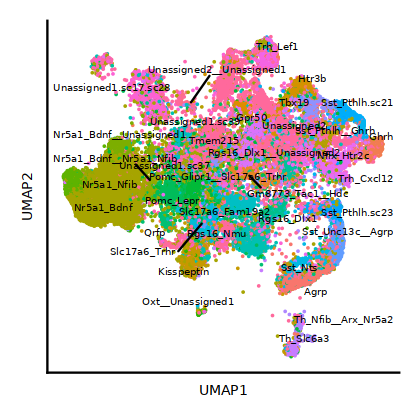

In [102]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_neuron_2s_uni')
options(repr.plot.width=3.5, repr.plot.height=3.5)
umap_neuron = DimPlot(xe_obj, pt.size= 0.0001, reduction = "ref.umap", group.by = "labels", label = TRUE, repel = TRUE, raster=FALSE, label.size=2) +
theme(legend.position = "none")  +
labs(title = "Molecular cartography cells on snRNA-seq UMAP",
     x = 'UMAP1', y='UMAP2') + 
theme(plot.title = element_blank(),
#       plot.title = element_text(size = 8),
      axis.title.y = element_text(size=8),
      axis.text.y = element_blank(),
      axis.ticks.y = element_blank(),
      axis.title.x = element_text(size=8),
      axis.text.x = element_blank(),
      axis.ticks.x = element_blank())
umap_neuron

In [105]:
layout <- '
AA
BB
CD
CD
'
ggp = wrap_plots(A = neurons_plot,
                 B = tany_plot,
                 C = umap_other,
                 D = umap_neuron,
        design = layout) +
    plot_layout(guides = 'collect') #& 

# plot_annotation(tag_levels = c('A', 'B', 'C', 'D'))

ggp %>% ggsave("spatial_umap_plots.pdf", ., width = 7.5, height = 6)

Warning message:
“Removed 286 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 194 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 211 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 112 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 248 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 251 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 424 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 152 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 158 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 227 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 283 rows contain